<a href="https://colab.research.google.com/github/Hana-Ali/TVB_WBM_BayesianOptimization/blob/main/WBM_BayesianOptimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Comparison Tests of Activity-based, Voltage-based Neural Mass and Oscillatory Models
The goal of this notebook is to compare the best fit results of 6 models, using TVB. These models are:

1. **Activity-based:** Wilson-Cowan, Reduced Wong-Wang

2. **Voltage-based:** Jansen-Rit, Larter-Breakspear

3. **Oscillatory**: Kuramoto, Stuart-Landau

----

In [1]:
# Determine whether in colab or not, to define folder paths
colab = True

if colab:
  from google.colab import output
  output.enable_custom_widget_manager()

In [2]:
if colab:
  from google.colab import drive
  drive.mount('/content/drive')

  !pip install netneurotools bctpy mayavi tvb-library tvb-widgets pymccorrelation sbi torch torchvision torchaudio multiprocess bayesian-optimization

Mounted at /content/drive
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.7/95.7 kB 10.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 29.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 799.5/799.5 kB 41.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.3/269.3 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 79.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5

# __Part 1:__ Empirical SC and FC
For this part, x parcellations will be used in our analysis, to see model reliability. These are obtained from DOI: 10.25493/81EV-ZVT

In [2]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt

%load_ext autoreload
%matplotlib widget

from tvb.simulator.lab import *
from tvb.simulator.plot.phase_plane_interactive import PhasePlaneInteractive
#from tvbwidgets.api import PhasePlaneWidget

#### *TVB SC*

In [ ]:
# Define path to main data folder
rootDataPath = 'C:\\Users\\Hana PC\\Desktop\\ISO\\NOTEBOOKS\\tvb_data\\tvb_data\\connectivity\\'

# Define path to the Schaefer Parcellation scheme - SC
connectPath = os.path.join(rootDataPath, 'connectivity_76.zip')

# Get the connectivity from the file
structuralConnec = connectivity.Connectivity.from_file(connectPath)

# Get the number of regions and set conduction speed
numberOfRegions = len(structuralConnec.region_labels)
structuralConnec.speed = np.array([4.0])
structuralConnec.configure()

# PROCESSING...
np.fill_diagonal(structuralConnec.weights, 0.0)
structuralConnec.weights /= np.percentile(structuralConnec.weights, 99)

WARNING  File 'hemispheres' not found in ZIP.


*Looking at properties of the structural connectivity, and plotting*

In [ ]:
structuralConnec

,value
Number of connections,1560
Number of regions,76
Undirected,False
areas,"[min, median, max] = [0, 2580.89, 10338.2] dtype = float64 shape = (76,)"
tract_lengths,"[min, median, max] = [0, 71.6635, 153.486] dtype = float64 shape = (76, 76)"
tract_lengths (connections),"[min, median, max] = [4.93328, 57.503, 138.454] dtype = float64 shape = (1494,)"
tract_lengths-non-zero,"[min, median, max] = [4.93328, 74.0646, 153.486] dtype = float64 shape = (5402,)"
weights,"[min, median, max] = [0, 0, 1] dtype = float64 shape = (76, 76)"
weights-non-zero,"[min, median, max] = [0.00154211, 0.666667, 1] dtype = float64 shape = (1494,)"


In [ ]:
def plot_connectivity(structural):
    fig = plt.figure(figsize=(15, 7))
    fig.suptitle('Structural Connectivity', fontsize=20)

    # Weights
    plt.subplot(121)
    plt.imshow(structural.weights, interpolation='nearest', aspect='equal', cmap='jet')
    plt.xticks(range(0, structural.number_of_regions), structural.region_labels, fontsize=7, rotation=90)
    plt.yticks(range(0, structural.number_of_regions), structural.region_labels, fontsize=7)
    cb = plt.colorbar(shrink=0.2)
    cb.set_label('Weights', fontsize=14)

    # Tracts lengths
    plt.subplot(122)
    plt.imshow(structural.tract_lengths, interpolation='nearest', aspect='equal', cmap='jet')
    plt.xticks(range(0, structural.number_of_regions), structural.region_labels, fontsize=7, rotation=90)
    plt.yticks(range(0, structural.number_of_regions), structural.region_labels, fontsize=7)
    cb = plt.colorbar(shrink=0.2)
    cb.set_label('Tract lenghts', fontsize=14)

    fig.tight_layout()

    plt.show()

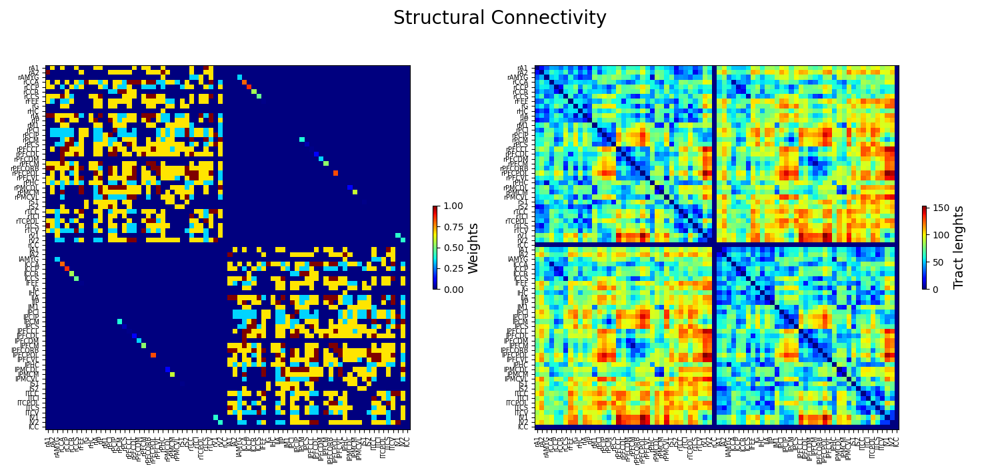

In [ ]:
# Visualize the structural connectivity matrix of the whole brain
plot_connectivity(structuralConnec)

## *Dr. Pedro's SC and FC*

In [3]:
# Determine whether in colab or not, to define folder paths
colab = True

In [4]:
import scipy.io as sio

# Define path to main data folder
if colab:
  rootDataPath = '/content/drive/MyDrive/HCP_DTI_BOLD/'
else:
  rootDataPath = 'C:/Users/Hana PC/Desktop/ISO/HCP_DTI_BOLD/'

# Define path to structural and functional connectivity matrices
connectPathSC = os.path.join(rootDataPath, 'Schaefer100_DTI_HCP.mat')
connectPathFC = os.path.join(rootDataPath, 'Schaefer100_BOLD_HCP.mat')
# Load the matrices
structuralConnecAllSubjects = sio.loadmat(connectPathSC)
functionalConnecAllSubjects = sio.loadmat(connectPathFC)

# Load arrays of data for SC, FC. Note that structuralConnec and functionalConnec are arrays of arrays
# ---------- SC: For 100 subjects, each has a 100x100 2D array for the SC matrix of each subject. Thus, first extract for all 100 subjects
structuralConnecAllSubjects = np.array(structuralConnecAllSubjects['DTI_fibers_HCP'])
# ---------- FC: For 100 subjects, each has a 100x1189 2D array. Each subject has 100 brain regions, with a 1189 element time-series for each region
functionalConnecAllSubjects = np.array(functionalConnecAllSubjects['BOLD_timeseries_HCP'])

# For every subject, first [], there is only 1 2D array, [0], that has the SC/FC matrix. Turn it into 100x100x100 matrix
# ---------- SC
stackSC = np.concatenate(structuralConnecAllSubjects, axis=0)
stackSCList = np.array([subject for subject in stackSC])
# ---------- FC
stackFC = np.concatenate(functionalConnecAllSubjects, axis=0)
stackFCList = np.array([subject for subject in stackFC])

*Define path for the SC and FC*

In [5]:
if colab:
    SC_FC_path = '/content/drive/MyDrive/tvb_comparison/SC_FC_arrays'
else:
    SC_FC_path = 'C:\\Users\\Hana PC\\Desktop\\ISO\\NOTEBOOKS\\ISO_code\\tvb_comparison\\SC_FC_arrays'

### *Processing the SC - Consensus Averaging*

In [6]:
# Define the consensus - if more than 60% of the elements along an axis are
# non-empty, find mean
consensus = 0.5

# Define non-zero counter function
def count_nonzero(array):
    return np.count_nonzero(array)

# Define arrays to hold intermediate results
consensusAverageSC = []
elements = []


# For every subject
for i in range(0, stackSCList.shape[0]):
  # For every row
  for j in range(0, stackSCList.shape[1]):
    # Refresh elements to be empty
    elements = []
    # For every column
    for k in range(0, stackSCList.shape[2]):
      # Extracts for every subject (k first), for every row j, for every column i
      elements.append(stackSCList[k][j][i])

    # After extracting all elements along axis 2, count number of non-zeros
    nonZerosCount = np.count_nonzero(elements)
    # Get the percentage of non-zeros
    nonZerosPercent = nonZerosCount / stackSCList.shape[2]
    # If more nonzeros than required percent
    if (nonZerosPercent >= consensus):
      # Find mean of the array
      meanValue = np.mean(elements)
      # Append mean
      consensusAverageSC.append(meanValue)
    # If less nonzero than require percent
    else:
      # Append zero
      consensusAverageSC.append(0)


*Reshape to 100x100*

In [7]:
# Turn into numpy array -> create new axis -> reshape
consensusAverageSCNP = np.array(consensusAverageSC)
consensusAverageSCNP = consensusAverageSCNP[..., np.newaxis]
consensusAverageSCNP = np.reshape(consensusAverageSCNP, (100,100))

*Save and Load consensus averaged SC*

In [8]:
# Define the path
consensusSC_path = os.path.join(SC_FC_path, 'consensusSC.npy')
# Save the SC matrix
with open(consensusSC_path, 'wb') as f:
    np.save(f, consensusAverageSCNP)

In [9]:
# Load the SC matrix
consensusSCLoaded = np.load(consensusSC_path)

*Plot SC matrix - NO OUTLIER REMOVAL*

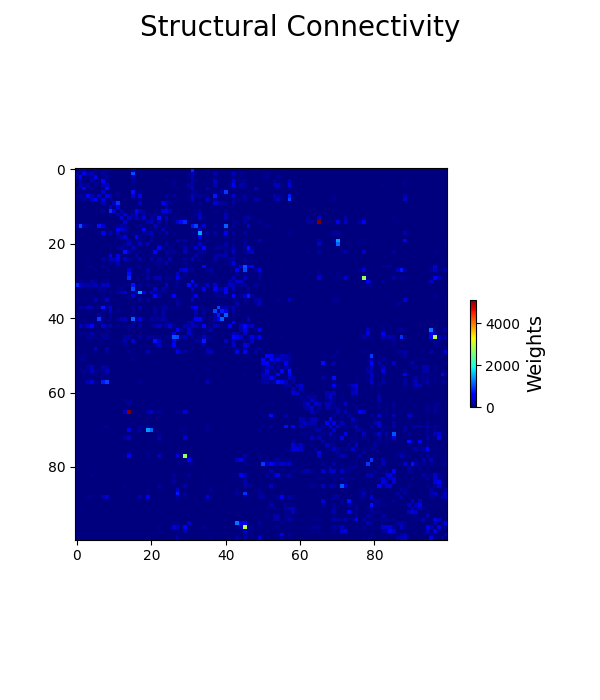

In [10]:
# Define the figure
fig = plt.figure(figsize=(6, 7))
# Define the title
fig.suptitle('Structural Connectivity', fontsize=20)

# Plot the SC matrix, with a colorbar, and set label
plt.imshow(consensusSCLoaded, interpolation='nearest', aspect='equal', cmap='jet')
cb = plt.colorbar(shrink=0.2)
cb.set_label('Weights', fontsize=14)


*Plot SC matrix - OUTLIER DETECTION (2 WAYS)*

In [11]:
# Reshape the consensusSC matrix
consensusSCLoadedList = np.reshape(consensusSCLoaded, (-1,1))

# For every element in the list, if it's greater than some arbitrary max, make max
for idx, element in enumerate(consensusSCLoadedList):
  if element > 300:
    consensusSCLoadedList[idx] = 300

# Reshape to a 100x100 matrix
finalConsensusSC = np.reshape(consensusSCLoadedList, (100, 100))


In [12]:
from scipy import stats
from sklearn.preprocessing import MinMaxScaler

# Reshape the consensusSC matrix
consensusSCLoadedList = np.reshape(consensusSCLoaded, (-1,1))

# Identify outliers - find mean and STD
mean = np.mean(consensusSCLoadedList)
std_dev = np.std(consensusSCLoadedList)
# More than 3 standard deviations from the mean an outlier
threshold = 3 
# Create the condition to find outliers
outliers = consensusSCLoadedList[np.abs(consensusSCLoadedList - mean) > threshold * std_dev]
print('Number of outliers', len(outliers))

# For every element in the SC matrix, if it's an outlier, make it the maximum
for idx, element in enumerate(consensusSCLoadedList):
  if element in outliers:
    consensusSCLoadedList[idx] = threshold * std_dev

# Reshape to matrix
consensusSCLoadedList = np.reshape(consensusSCLoadedList, (100, 100))

# Min-max scaling
scaler = MinMaxScaler()
# transform data
finalConsensusSC = scaler.fit_transform(consensusSCLoadedList)


Number of outliers 508


In [13]:
# Create the final consensus SC matrix - after processing
finalConsensusSC_path = os.path.join(SC_FC_path, 'finalConsensusSC.npy')
# Save the SC matrix
with open(finalConsensusSC_path, 'wb') as f:
    np.save(f, np.array(finalConsensusSC))

In [14]:
# Load the SC matrix
finalConsensusSC = np.load(finalConsensusSC_path)

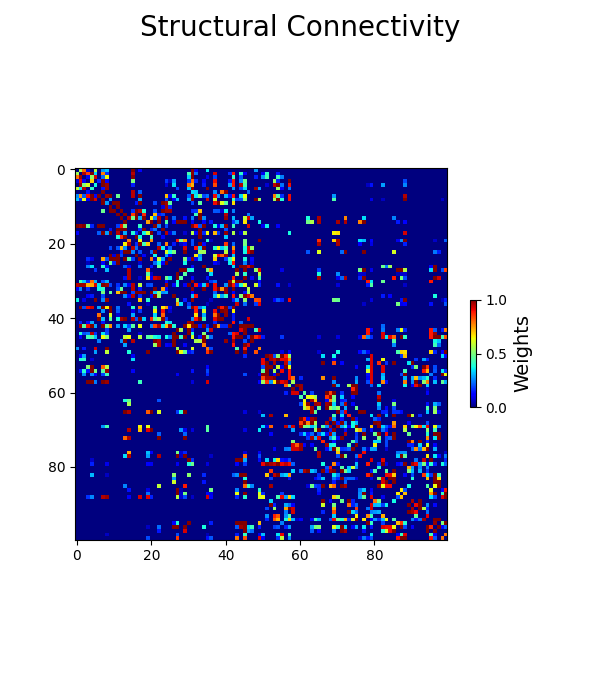

In [15]:
# Define the figure
fig = plt.figure(figsize=(6, 7))
# Define the title
fig.suptitle('Structural Connectivity', fontsize=20)

# Plot the SC matrix, with a colorbar, and set label
plt.imshow(finalConsensusSC, interpolation='nearest', aspect='equal', cmap='jet')
cb = plt.colorbar(shrink=0.2)
cb.set_label('Weights', fontsize=14)


### *Processing the FC - Normal Averaging*

*Plot BOLD timeseries for one subject, one ROI for visualization*

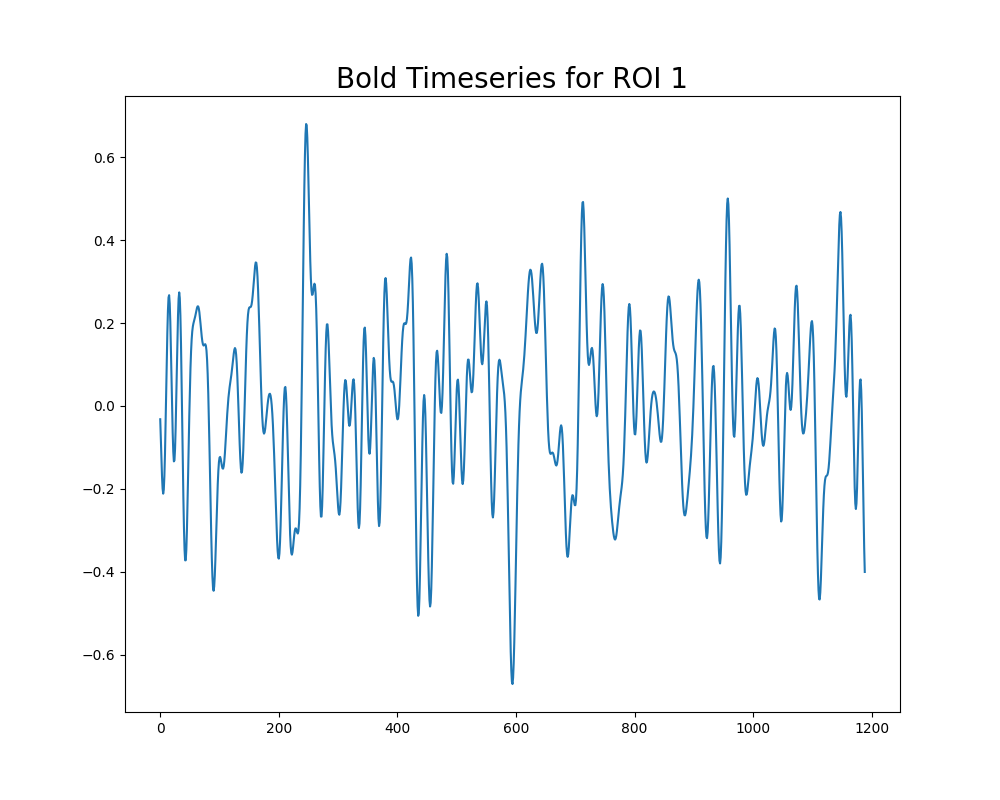

In [16]:
# Plot the FC time series for a subject to help with visualization
subject1 = functionalConnecAllSubjects[0][0]

# Create and plot the title
fig1 = plt.figure(figsize=(10, 8))
plt.plot(range(0, subject1.shape[1]), subject1[0].T)
plt.title('Bold Timeseries for ROI 1', fontsize=20)

plt.show()

*Convert from BOLD $\to$ FC matrix using Pearson Correlations*

In [23]:
import scipy.signal as signal
import scipy.stats as stats

# List of all subject correlations
subjectCorrelations = []

# Define the butter bandpass filter
def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

# Perform the actual filtering
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

# For each subject
for idx, subject in enumerate(stackFCList):
  # Get the signal mean to regress it out of signal
  bold_sigMean = np.mean(subject, axis=0)
  bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
  # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
  hundred_ones = np.ones((100, 1))
  # Matrix multiplitcation to get repeated matrix
  bold_sigMean = hundred_ones @ bold_sigMean
  ###### GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
  # regress new signal from old one
  bold_regressed = subject - bold_sigMean
  ###### BANDPASS FILTER 0.01 -> 0.1
  bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)
  # z-score signal
  bold_z_score = stats.zscore(bold_filtered)
  # Find correlation
  correlation = np.corrcoef(bold_z_score)
  # Append correlation to list
  subjectCorrelations.append(correlation)

In [19]:
# Find the average
subjectCorrelationsNP = np.array(subjectCorrelations)
functionalConnecMean = np.mean(subjectCorrelationsNP, axis=0)

# PROCESSING...
np.fill_diagonal(functionalConnecMean, 0.0)
# functionalConnecMean /= np.percentile(functionalConnecMean, 99)

*Save and Load averaged FC*

In [20]:
# Define the path of the FC matrix
functionalConnecMean_path = os.path.join(SC_FC_path, 'functionalConnecMean.npy')

# Save the functional connectivity matrix
with open(functionalConnecMean_path, 'wb') as f:
    np.save(f, functionalConnecMean)

In [21]:
# Load the functional connectivity matrix
functionalConnecMean = np.load(functionalConnecMean_path, allow_pickle=True)

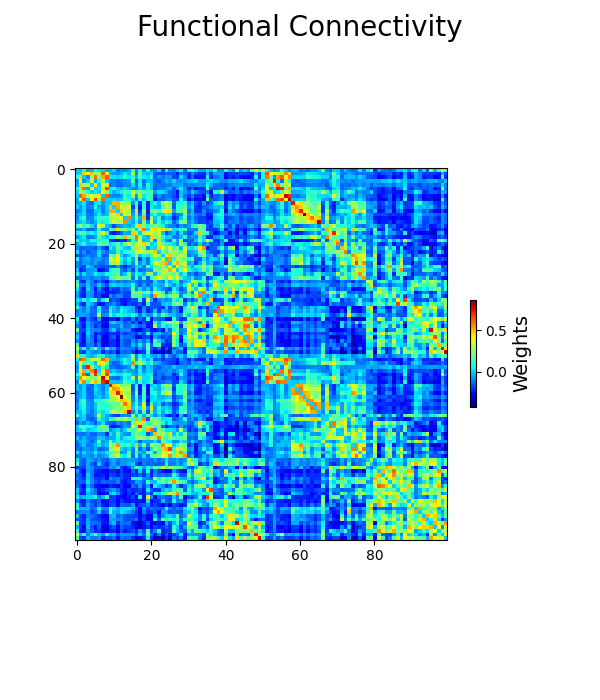

In [22]:
# Create the figure and title
fig = plt.figure(figsize=(6, 7))
fig.suptitle('Functional Connectivity', fontsize=20)

# Plot the matrix with a colorbar
plt.imshow(functionalConnecMean, interpolation='nearest', aspect='equal', cmap='jet')
cb = plt.colorbar(shrink=0.2)
cb.set_label('Weights', fontsize=14)


## *Defining Structural Connectivity in TVB, and plotting*

### *Defining the tract lengths and centres*

In [ ]:
import scipy.io as sio
import pandas as pd

# Define path to main data folder
if colab:
  rootDataPath = '/content/drive/MyDrive/HCP_DTI_BOLD/'
else:
  rootDataPath = 'C:/Users/Hana PC/Desktop/ISO/HCP_DTI_BOLD/'

# Define path to tract lengths and centers
tractPath = os.path.join(rootDataPath, 'Schaefer100_HCP_DTI_length.mat')
# Converted to XYZ :)
centersPath = os.path.join(rootDataPath, 'centers_r2.csv')
# Load the matrices
tractPathsMatrix = sio.loadmat(tractPath)
centersPathFull = pd.read_csv(centersPath)
centersPathMatrix = centersPathFull[["ROILabel", "X", "Y", "Z"]]
centersPathHeaders = centersPathFull["ROIName"]
centersPathMatrixNum = centersPathMatrix.astype(np.float64)
# Convert from pandas to NUMPY
centersPathMatrixNP = centersPathMatrixNum.to_numpy()
centersPathHeadersNP = centersPathHeaders.to_numpy(dtype='str')

# Extract the tract lengths
tractLengths = np.array(tractPathsMatrix['connectivity'])


In [ ]:
# Define the structural connectivity matrix
structuralConnec = connectivity.Connectivity(
    weights = finalConsensusSC,
    number_of_regions = int(finalConsensusSC.shape[0]),
    number_of_connections = int(finalConsensusSC.nonzero()[0].shape[0]),
    region_labels=centersPathHeadersNP,
    tract_lengths=tractLengths,
    areas=np.zeros(np.shape(finalConsensusSC)[0]),
    speed=np.array([4.0],dtype=float),
    centres = centersPathMatrixNP
)

In [ ]:
# Print out the SC object
structuralConnec

,value
Number of connections,2064
Number of regions,100
Undirected,False
areas,"[min, median, max] = [0, 0, 0] dtype = float64 shape = (100,)"
tract_lengths,"[min, median, max] = [0, 0, 219.1] dtype = float64 shape = (100, 100)"
tract_lengths (connections),"[min, median, max] = [0, 25.9706, 204.714] dtype = float64 shape = (2064,)"
tract_lengths-non-zero,"[min, median, max] = [11.72, 77.3158, 219.1] dtype = float64 shape = (1522,)"
weights,"[min, median, max] = [0, 0, 1] dtype = float64 shape = (100, 100)"
weights-non-zero,"[min, median, max] = [0.0467642, 0.463911, 1] dtype = float64 shape = (2064,)"


In [ ]:
# Function that defines plotting structural connectivity with the labels
def plot_connectivity(structural):
    fig = plt.figure(figsize=(10, 10))
    fig.suptitle('Structural Connectivity', fontsize=20)

    plt.imshow(structural.weights, interpolation='nearest', aspect='equal', cmap='jet')
    plt.xticks(range(0, structural.number_of_regions), structural.region_labels, fontsize=7, rotation=90)
    plt.yticks(range(0, structural.number_of_regions), structural.region_labels, fontsize=7)
    cb = plt.colorbar(shrink=0.2)
    cb.set_label('Weights', fontsize=14)

    plt.show()

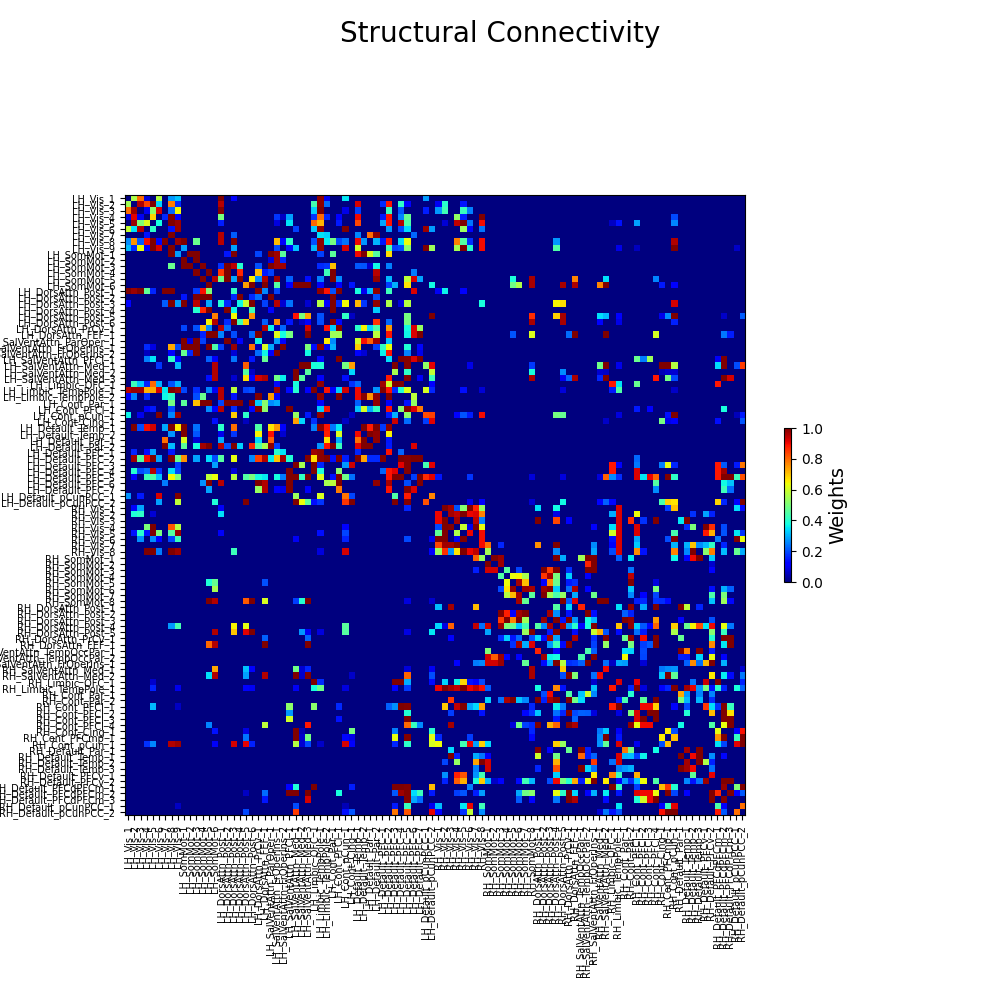

In [ ]:
# Visualize the structural connectivity matrix of the whole brain
plot_connectivity(structuralConnec)

---

# __Part 2:__ Model Definition
Here, we define the models that we will use, all six in the report paper. Before we begin, we define a few things that are important to remember, and that go into every neural mass model:

### *------------------------- Coupling -------------------------*
The activity (state-variables) that have been propagated over the long-range `Connectivity` pass through these functions before entering the equations (`Model.dfun()`) describing the local dynamics.

The state-variable vector for the $k$-th node or region in the network can be expressed as:
$$\text{Derivative = Noise + Local dynamics + Coupling(time delays).}$$
More formally:
\begin{equation}
         \dot{\Psi}_{k} = - \Lambda\left(\Psi_{k}\right) + Z \left(\Xi_{k} + \sum_{j=1}^{l} u_{kj} \Gamma_{v=2}[\left(\Psi_{k}(t),  \Psi_{j}(t-\tau_{kj}\right)]\right)
\end{equation}
Here we compute the term $\text{Coupling(time delays)}$ or $\sum_{j=1}^{l} u_{kj} \Gamma_{v=2}[\left(\Psi_{k}(t),  \Psi_{j}(t-\tau_{kj}\right)]$, 
where $u_{kj}$ are the elements of the weights matrix from a `Connectivity` datatype. This term is equivalent to the dot product between the weights matrix (on the left) and the delayed state vector. 

This order is important in the case of an asymmetric connectivity matrix, where the convention to distinguish target ($k$) and source ($j$) nodes is the following:
\begin{equation}
\begin{gathered}
\left(
\begin{matrix} 
a & b \\
c & d
\end{matrix}
\right) 
\\
C_{kj}  = 
\left(
\begin{matrix} 
  & 0 & 1 & 2 & \cdots & l \\
0 & 1 & 1 & 0 &   1    & 0 \\
1 & 1 & 1 & 0 &   1    & 0 \\
2 & 1 & 0 & 0 &   1    & 0 \\
\vdots & 1 & 0 & 1 & 0 & 1 \\
l & 0 & 0 & 0 &   0    & 0
\end{matrix}
\right)
\end{gathered}
\end{equation}
NOTE: Our convention is the inverse of the BCT toolbox. Furthermore, this convention is consistent with the notation used in Physics and in our equation, ie, $u_{kj}$ matches row-column indexing and describes the connection strength from node $j$ to node $k$


### *------------------------- Parameters -------------------------*
Every model has some *fixed* parameters, and some *free* parameters.

- **Fixed parameters** are identified with various techniques, and correspond to biological quantities. Different parameter values correspond to different behaviours of the model *(i.e., limit cycle oscillations, number of steady-states, etc.)*
- **Free parameters** are things which can be modified in order to find the best-fit simFC compared to the empFC. Typically, these parameters are the coupling strength $G$, and the time delay $\tau$ also used in connectivity. In general, we don't typically alter $\tau$ directly, but instead alter the conduction $speed$, which is used to find the conduction delay. One other parameter which you could maybe change is the $\text{integration } dt$, which is used for conduction delay indices. 

Two important links with the changeable parameters:
- `Coupling`, for the $G$: https://github.com/the-virtual-brain/tvb-root/blob/master/tvb_library/tvb/simulator/coupling.py
- `Connectivity`, for the $\tau$: https://github.com/the-virtual-brain/tvb-root/blob/master/tvb_library/tvb/datatypes/connectivity.py



```
    a = NArray(
        label=":math:`a`",
        default=numpy.array([0.00390625,]),
        domain=Range(lo=0.0, hi=1.0, step=0.01),
        doc="Rescales the connection strength while maintaining the ratio "
            "between different values.")

    idelays = NArray(
        dtype=int,
        label="Conduction delay indices",
        required=False,
        doc="An array of time delays between regions in integration steps.")

    delays = NArray(
        label="Conduction delay",
        required=False,
        doc="""Matrix of time delays between regions in physical units, setting conduction speed automatically
            combines with tract lengths to update this matrix, i.e. don't try and change it manually.""")
```



### *------------------------- Simulation Duration -------------------------*
Remember that typically, a simulation needs to run for a little while *before* the model is considered to reach steady-state. This *transient period* is typically discovered in the BOLD signal monitored. Few notes:

- TR is 1 and a half seconds give or take
- 10s or 20 TR is the time transient to ignore
- TR is 700 ms for Dr. Pedro's FC data, so the BOLD signal to monitor must have the same TR

----
----

## **1 - Wilson-Cowan**
In a brain network, each WC node is defined by the equation:
$$
\begin{equation}
    \begin{gathered}
\dot E_k = \frac{1}{\tau_e}\left(-E_k + (k_e - r_eE_k)S_e\left[\alpha_e\left(c_{ee}E_k - c_{ei}I_k+P_k - \theta_e + \Gamma\left(E_k,E_j,u_{kj}\right)+W_{\varsigma} E_j + W_{\varsigma} I_j\right)\right]\right)
\\
\dot I_k = \frac{1}{\tau_i}\left(-I_k + (k_i - r_iI_k)S_i\left[\alpha_i\left(c_{ie}E_k - c_{ii}I_k+Q_k - \theta_i + \Gamma\left(E_k,E_j,u_{kj}\right)+W_{\varsigma} E_j + W_{\varsigma} I_j\right)\right]\right)
    \end{gathered}
\end{equation}
$$
where $W_{\varsigma} E_j$ and $W_{\varsigma} I_j$ are the activity of the excitatory and inhibitory populations in the local neighbourhood. Generally, $r_e = r_i = 0, k_e = k_i = 1$ to simplify calculations. Note that depending on the parameter values chosen, different behaviours can be exhibited. 

Characteristics of $\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right)$ is what we'll be changing, as the model's parameters. Here, the coupling takes the form of:
$$
\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right) = a\left(\sum_{j=1}^l u_{kj} \mathbf{\Psi}_j\left(t - \tau_{kj}\right)\right) + b
$$
in which $u_{kj}$ is the connectivity matrix, and the parameters $a$ and $\tau_{kj}$ are what we vary. In code, this is implemented as:
```
class Linear(SparseCoupling):
    r"""
    Provides a linear coupling function of the following form
    .. math::
        a x + b
    """

    a = NArray(
        label=":math:`a`",
        default=numpy.array([0.00390625,]),
        domain=Range(lo=0.0, hi=1.0, step=0.01),
        doc="Rescales the connection strength while maintaining the ratio "
            "between different values.")

    b = NArray(
        label=":math:`b`",
        default=numpy.array([0.0]),
        doc="Shifts the base of the connection strength while maintaining "
            "the absolute difference between different values.")

    parameter_names = 'a b'.split()
    pre_expr = 'x_j'
    post_expr = 'a * gx + b'

    def post(self, gx):
        return self.a * gx + self.b

    def __str__(self):
        return simple_gen_astr(self, 'a b')
```
where we vary $a$ from the coupling and the `conduction_speed` in the `wilson_simulator` to edit $\tau_{kj}$

In [ ]:
# Define model parameters
wilson_params_limitCycle = {
        "r_e": np.array([1.0]),
        "r_i": np.array([1.0]),
        "k_e": np.array([1.0]),
        "k_i": np.array([1.0]),
        "tau_e": np.array([8.0]),
        "tau_i": np.array([8.0]),
        "c_ee": np.array([16.0]),
        "c_ei": np.array([12.0]),
        "c_ie": np.array([15.0]),
        "c_ii": np.array([3.0]),
        "alpha_e": np.array([1.0]),
        "alpha_i": np.array([1.0]),
        "a_e": np.array([1.3]),
        "a_i": np.array([2.0]),
        "b_e": np.array([4.0]),
        "b_i": np.array([3.7]),
        "c_e": np.array([1.0]),
        "c_i": np.array([1.0]),
        "theta_e": np.array([2.0]),
        "theta_i": np.array([3.5]),
        "P": np.array([1.25]),
        "Q": np.array([0.0]),
        "shift_sigmoid": np.array([False])
    }

# Define the model itself
wilson_model = models.WilsonCowan(**wilson_params_limitCycle)

### *Bayesian Optimization - Parameter Exploration*
In Bayesian Optimization, the idea is to use a surrogate *acquisition function* in order to find the next point to evaluate. Here, we use a specific package that uses a Gaussian process as the surrogate. Bayesian Optimization is particularly suited for optimization of high cost functions, of which this is such a case.

Bayesian optimization works by constructing a posterior distribution of functions (gaussian process) that best describes the function you want to optimize. As the number of observations grows, the posterior distribution improves, and the algorithm becomes more certain of which regions in parameter space are worth exploring and which are not.

As you iterate over and over, the algorithm balances its needs of exploration and exploitation taking into account what it knows about the target function. At each step a Gaussian Process is fitted to the known samples (points previously explored), and the posterior distribution, combined with a exploration strategy (such as UCB (Upper Confidence Bound), or EI (Expected Improvement)), are used to determine the next point that should be explored.

#### *Step 1: Creating the BlackBox Function to Be Optimized*

First, we need to create the costly blackbox function that we optimize over. This is exactly the simulation function, that will do the following:

1. Given a set of parameters, configure the simulator
2. Run a simulation, to get the neural activity results
3. Convert neural activity to BOLD fMRI signal, using the Balloon-Windkessel model
4. Find correlations between BOLD signals for each of the brain regions, to make the simFC
5. Find correlation between simFC and empFC, and maximize this measure

In [ ]:
from bayes_opt import BayesianOptimization, UtilityFunction
from matplotlib import gridspec

*Define the black-box function*

One thing to keep in mind here, is that the BOLD monitor for TVB will sample ONCE every period. For example, since the period for our data is 700ms, then every 700ms, the simulation takes 1 BOLD response sample. Thus, we need to take into consideration BOTH that we ignore the first 20 (samples) * 700 = 14,000 ms of simulation as the transient time, as well as the fact that we need data to analyze afterwards


In [ ]:
import scipy.stats as stats
import scipy.signal as signal
from tqdm import tqdm
import numpy as np

def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

# Defining the black-box function
def black_box_wilson(couplingA, speed):
    # For every point, replicate 5 times to get an average measure of what the variability is like, or the spread of correlation. The area
    # with the lowest spread and highest correlation is best. We need to test for both a HIGH RELIABILITY AND HIGH PRECISION!!!!

    # Number of replications
    replications = 1
    # Define a range from 0 -> replications
    frames_list = np.arange(0, replications)

    replication_similarities = []

    ############ PARALLELIZING THE 5 REPETITIONS
    for rep in range(0, replications):
      # Define the monitor
      monitor_raw = monitors.Raw()
      # TR is 700 ms for Dr. Pedro's FC data
      monitor_timeAvg = monitors.TemporalAverage(period=700)
      monitor_bold = monitors.Bold(period=700)

      # Define a linear coupling function
      # ------------ HAS FREE PARAMETER a THAT WILL BE MODIFIED
      wilson_coupling = coupling.Linear(a=np.array(couplingA))

      # Define the conduction speed
      # ------------ HAS FREE PARAMETER speed THAT WILL BE MODIFIED
      conduction_speed = speed

      # Define the integrator, that will solve the dynamic equation
      dt = 0.01
      stdNoise = np.array([1e-4])
      wilson_noise = noise.Additive(nsig=stdNoise, noise_seed=np.random.randint(1,1000000))
      wilson_integrator = integrators.HeunStochastic(dt=dt, noise=wilson_noise)

      # Define the simulation length - remember that we ignore the first 20 * TR (700) = 14000
      TR = 700
      multiple_TR = 40
      simulation_len =  multiple_TR * TR

      wilson_simulator = simulator.Simulator(
          model=wilson_model,
          connectivity=structuralConnec,
          conduction_speed=conduction_speed,
          coupling=wilson_coupling,
          integrator=wilson_integrator,
          monitors=(monitor_raw, monitor_timeAvg, monitor_bold),
          simulation_length=simulation_len
      )
      wilson_simulator.configure()

      ################################################################## RUNNING SIMULATION

      # 2. Run a simulation to get ALL 3 types of results
      # 2.1 Perform the simulation
      tic = time.time()
      (wilson_raw_time, wilson_raw_data), (wilson_tavg_time, wilson_tavg_data), (wilson_bold_time, wilson_bold_data) = wilson_simulator.run()
      print('simulation required %0.3f seconds.' % (time.time()-tic))

      ################################################################## SAVING RESULTS OF SIMULATION

      # 2.3 Save the results
      if colab:
          wilson_folder = r'/content/drive/MyDrive/tvb_comparison/wilson/replication{}'.format(rep)
          new_wilson_folder = r'/content/drive/MyDrive/tvb_comparison/wilson/replication{}'.format(rep)
      else:
          wilson_folder = r'D:\\ISO_CODE\\wilson\\replication{}'.format(rep)
          new_wilson_folder = r'D:\\ISO_CODE\\wilson\\replication{}'.format(rep)
      i = 1
      # If folder for results exists, change name until name doesnt exist
      while os.path.exists(new_wilson_folder):
          new_wilson_folder = wilson_folder + str(i)
          i += 1
      os.makedirs(new_wilson_folder)
      np.save(os.path.join(new_wilson_folder, 'tavg_time.npy'), wilson_tavg_time)
      np.save(os.path.join(new_wilson_folder, 'tavg_data.npy'), wilson_tavg_data)
      np.save(os.path.join(new_wilson_folder, 'bold_time.npy'), wilson_bold_time)
      np.save(os.path.join(new_wilson_folder, 'bold_data.npy'), wilson_bold_data)

      ################################################################## FORMATTING BOLD AND FINDING ORDER

      # 3. Given BOLD signal, find correlation between to make simFC
      # 3.1 Concatenate across axes to get it in correct shape
      wilson_bold = np.concatenate(wilson_bold_data, axis=0)
      wilson_bold = np.concatenate(wilson_bold, axis=1)
      # 3.2 Ignore transient part
      wilson_bold = np.delete(wilson_bold, np.s_[0:20], axis=1)
      # 3.2 GSR signal
      # Get the signal mean to regress it out of signal
      bold_sigMean = np.mean(wilson_bold, axis=0)
      bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
      # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
      hundred_ones = np.ones((100, 1))
      # Matrix multiplitcation to get repeated matrix
      bold_sigMean = hundred_ones @ bold_sigMean
      # GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
      # regress new signal from old one
      bold_regressed = wilson_bold - bold_sigMean
      ###### BANDPASS FILTER 0.01 -> 0.1
      bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)

      ################################################################## FINDING CORRELATION BETWEEN BOLD FOR simFC

      # 3.3 z-score signal
      wilson_b_z = stats.zscore(bold_filtered)
      # 3.4 Find correlations between different brain regions
      wilson_simFC = np.corrcoef(wilson_b_z)
      np.fill_diagonal(wilson_simFC, 0.0)
      np.save(os.path.join(new_wilson_folder, 'FC_matrix.npy'), wilson_simFC)

      ################################################################## FINDING CORRELATION simFC, empFC

      # 4. Find correlation between simFC and empFC (Pearson coefficient)
      # 4.1 Retrieve the upper triangular parts of both matrices
      functionalConnecMean = np.load(functionalConnecMean_path)
      wilson_corr = np.corrcoef(wilson_simFC.flatten(), functionalConnecMean.flatten())
      wilson_similarity = wilson_corr[0, 1]
      # 4.1 Save the found correlation
      np.save(os.path.join(new_wilson_folder,'simFC_empFC_corr.npy'), wilson_similarity)

      replication_similarities.append(wilson_similarity)
      print(replication_similarities)
      
    # Save results in the appropriate folders - if folder exists, create another
    i = 0
    if colab:
        wilson_folder = r'/content/drive/MyDrive/tvb_comparison/wilson/replicationResults{}'.format(i)
        new_wilson_folder = r'/content/drive/MyDrive/tvb_comparison/wilson/replicationResults{}'.format(i)
    else:
        wilson_folder = r'D:\\ISO_CODE\\wilson\\replicationResults{}'.format(i)
        new_wilson_folder = r'D:\\ISO_CODE\\wilson\\replicationResults{}'.format(i)
    while os.path.exists(new_wilson_folder):
        new_wilson_folder = wilson_folder + str(i)
        i += 1
    os.makedirs(new_wilson_folder)

    # Save across-test FCs
    np.save(os.path.join(new_wilson_folder, 'replication_similarities.npy'), np.array(replication_similarities))

    return replication_similarities[-1]

#### *Step 2: Define Parameter Bounds and Optimize*

*Define bounds and optimizer*

In [ ]:
# Defining parameter bounds for the function
parameter_bounds = {'couplingA': (0., 1.), 'speed': (1., 10.)}

# Defining the Bayesian Optimization object
optimizer = BayesianOptimization(
    f=black_box_wilson,
    pbounds=parameter_bounds,
    verbose=2,
    random_state=987234
)

*Define acquisition function and maximize*

This function does the actual maximization of the objective function, and takes two parameters: 
1. `n_iter`: Number of steps of BO to perform (the more the better)
2. `init_points`: Number of random exploration steps

In [ ]:
n_iter_BO = 35
n_init = 1

In [ ]:
# Defining the BO acquisition function
acquisition_function = UtilityFunction(kind="ei",xi=1e-1)

# Run the actual optimization
optimizer.maximize(
    n_iter=n_iter_BO,
    init_points=n_init,
    acquisition_function=acquisition_function
)

|   iter    |  target   | couplingA |   speed   |
-------------------------------------------------
simulation required 1510.199 seconds.
[-0.007307072477747773]
| 2         | -0.007307 | 0.1763    | 1.863     |
simulation required 1457.917 seconds.
[0.006005843615504155]
| 3         | 0.006006  | 0.7564    | 8.962     |
simulation required 1454.564 seconds.
[-0.02224703120321416]
| 4         | -0.02225  | 0.01006   | 5.898     |
simulation required 1441.602 seconds.
[0.005058755012382057]
| 5         | 0.005059  | 0.9926    | 3.794     |
simulation required 1478.713 seconds.
[-0.007215919981354395]
| 6         | -0.007216 | 0.01978   | 9.996     |
simulation required 1462.830 seconds.
[0.008504707136323885]
| 7         | 0.008505  | 0.9902    | 7.554     |
simulation required 1480.109 seconds.
[0.012666025301771008]
| 8         | 0.01267   | 0.007847  | 8.048     |
simulation required 1482.739 seconds.
[-0.006856987892704894]
| 9         | -0.006857 | 0.007786  | 3.426     |
simulatio

#### *Step 3: Examine Results*
Now that we've run Bayesian Optimization and have some measure of the best parameters for the model, we can extract the top combinations, to visualize the results in nice plots

*Get results of iterations from Bayesian Optimization*

In [ ]:
# Define the lists that will store the results of Bayesian Optimization
wilson_bo_values = []
wilson_bo_params = []

# For every run of Bayesian Optimization
for i, res in enumerate(optimizer.res):
    # Get the values of each iteration
    wilson_bo_values.append(res['target'])
    # Get the parameter values
    wilson_bo_params.append([res['params']['couplingA'], res['params']['speed']])

# Save the BO values
if colab:
    main_wilson_folder = '/content/drive/MyDrive/tvb_comparison/wilsonResults/'
else:
    main_wilson_folder = r'D:\\ISO_CODE\\wilson'

if not os.path.exists(main_wilson_folder):
    os.makedirs(main_wilson_folder)

np.save(os.path.join(main_wilson_folder, 'wilson_bo_values.npy'), np.array(wilson_bo_values))
np.save(os.path.join(main_wilson_folder, 'wilson_bo_params.npy'), np.array(wilson_bo_params))

In [ ]:
def posterior(optimizer, x_obs, y_obs, grid):
    optimizer._gp.fit(x_obs, y_obs)

    mu, sigma = optimizer._gp.predict(grid, return_std=True)
    return mu, sigma

def plot_gp(optimizer, x, given_lim, name):
    fig = plt.figure(figsize=(16, 10))
    steps = len(optimizer.space)
    fig.suptitle(
        'Gaussian Process and Utility Function After {} Steps'.format(steps),
        fontdict={'size':30}
    )
    
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1]) 
    axis = plt.subplot(gs[0])
    acq = plt.subplot(gs[1])
    
    x_obs = np.array([[res["params"][name]] for res in optimizer.res])
    y_obs = np.array([res["target"] for res in optimizer.res])
    
    mu, sigma = posterior(optimizer, x_obs, y_obs, x)
    # axis.plot(x, y, linewidth=3, label='Target')
    axis.plot(x_obs.flatten(), y_obs, 'D', markersize=8, label=u'Observations', color='r')
    axis.plot(x, mu, '--', color='k', label='Prediction')

    axis.fill(np.concatenate([x, x[::-1]]), 
              np.concatenate([mu - 1.9600 * sigma, (mu + 1.9600 * sigma)[::-1]]),
        alpha=.6, fc='c', ec='None', label='95% confidence interval')
    
    axis.set_xlim(given_lim)
    axis.set_ylim((None, None))
    axis.set_ylabel('f(x)', fontdict={'size':20})
    axis.set_xlabel('x', fontdict={'size':20})
    
    utility_function = UtilityFunction(kind="ucb", kappa=5, xi=0)
    utility = utility_function.utility(x, optimizer._gp, 0)
    acq.plot(x, utility, label='Utility Function', color='purple')
    acq.plot(x[np.argmax(utility)], np.max(utility), '*', markersize=15, 
             label=u'Next Best Guess', markerfacecolor='gold', markeredgecolor='k', markeredgewidth=1)
    acq.set_xlim(given_lim)
    acq.set_ylim((0, np.max(utility) + 0.5))
    acq.set_ylabel('Utility', fontdict={'size':20})
    acq.set_xlabel('x', fontdict={'size':20})
    
    axis.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)
    acq.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)

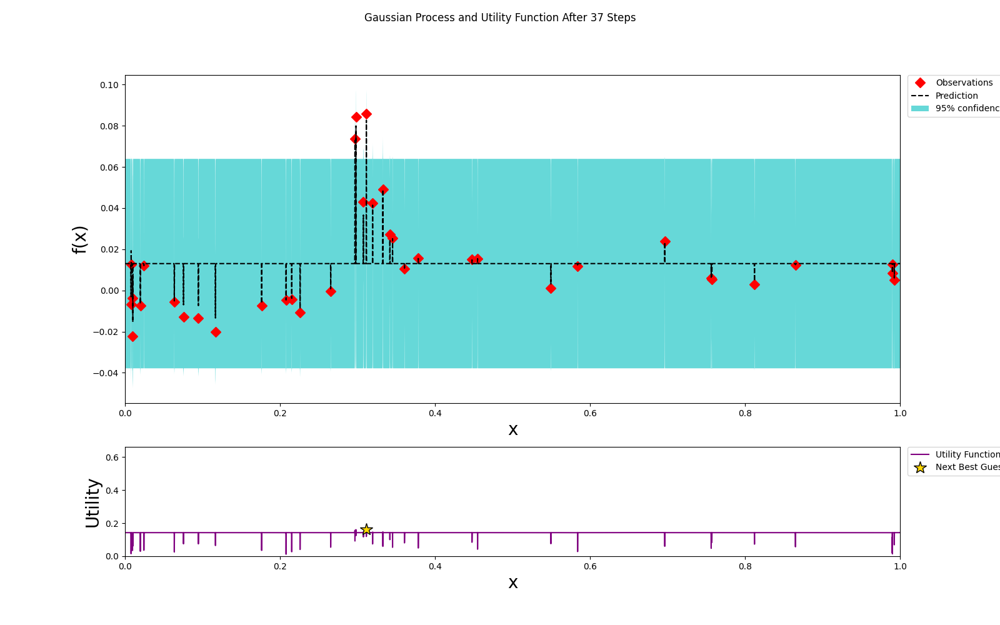

In [ ]:
coup = np.linspace(0., 1., 10000).reshape(-1, 1)
plot_gp(optimizer, coup, (0., 1.), "couplingA")

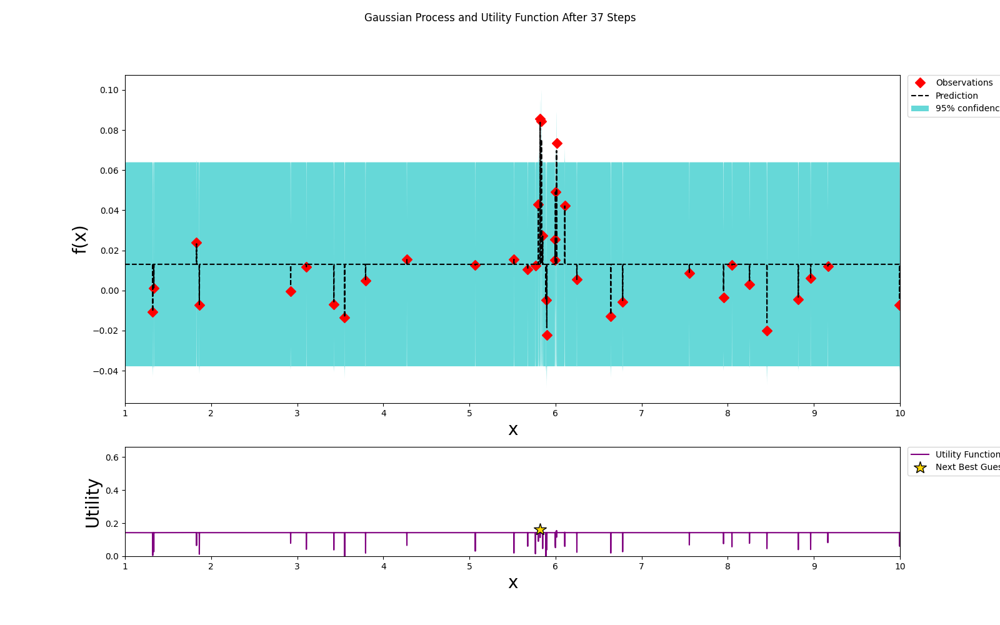

In [ ]:
spd = np.linspace(1., 10., 10000).reshape(-1, 1)
plot_gp(optimizer, spd, (1., 10.), "speed")

In [ ]:
# Save the BO values
if colab:
    main_wilson_folder = '/content/drive/MyDrive/tvb_comparison/wilsonResults/'
else:
    main_wilson_folder = r'D:\\ISO_CODE\\wilson'

# Load results of Bayesian Optimization
wilson_bo_params = np.load(os.path.join(main_wilson_folder, 'wilson_bo_params.npy'))
wilson_bo_values = np.load(os.path.join(main_wilson_folder, 'wilson_bo_values.npy'))

*Define helper functions for visualization*

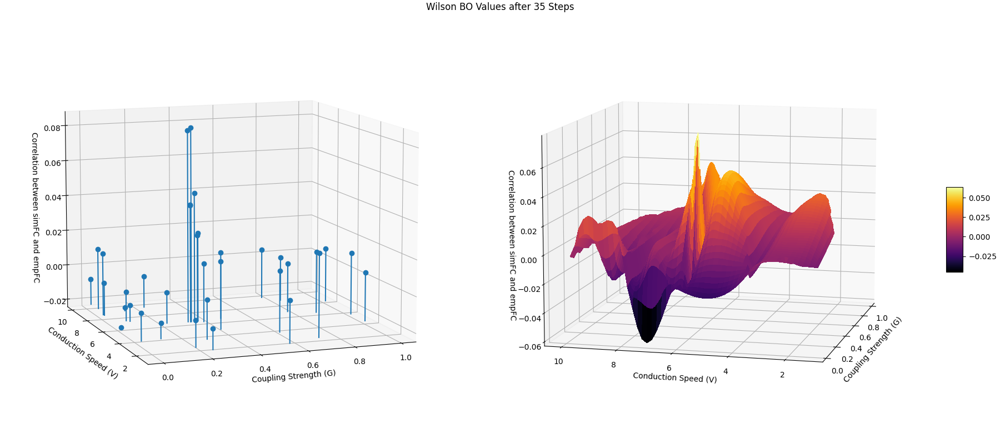

In [ ]:
# Turn them into numpy arrays
wilson_bo_paramsNP = np.array(wilson_bo_params)
wilson_bo_valuesNP = np.array(wilson_bo_values)

import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Function to plot the Bayesian Optimization results for every parameter value
def plot_bo_results(bo_params, bo_values, model_name, xlabel, ylabel, zlabel):
    # Extract the number of iterations of Bayesian Optimization
    steps = len(bo_values[:35])

    # Get the two parameter values
    x = bo_params[:35, 0]
    y = bo_params[:35, 1]
    # Get the output Bayesian Optimization values
    z = bo_values[:35]

    # Define the figure and first axis
    # fig = plt.figure(figsize=plt.figaspect(0.5))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8), subplot_kw=dict(projection='3d'), constrained_layout=True)
    # Define the min, max of the data
    xi = np.linspace(x.min(),x.max(),100)
    yi = np.linspace(y.min(),y.max(),100)
    # VERY IMPORTANT, to tell matplotlib how is your data organized
    zi = griddata((x, y), z, (xi[None,:], yi[:,None]), method='cubic')
    # Define the stem object
    ax1.stem(x, y, z, bottom=z.min(), basefmt=" ", orientation='z')
    ax1.view_init(elev=10, azim=-110)

    # Create a meshgrid
    xig, yig = np.meshgrid(xi, yi)
    # Define the surface object to plot
    surf = ax2.plot_surface(xig, yig, zi, linewidth=0, cmap='inferno', antialiased=False)
    # Add a color bar to the plot
    fig.colorbar(surf, shrink=0.2, aspect=5)
    ax2.view_init(elev=10, azim=-166)

    # Give the figure a title
    fig.suptitle('{} BO Values after {} Steps'.format(model_name, steps))
    # Set the labels of the figure
    ax1.set_xlabel('{}'.format(xlabel))
    ax2.set_xlabel('{}'.format(xlabel))
    ax1.set_ylabel('{}'.format(ylabel))
    ax2.set_ylabel('{}'.format(ylabel))
    ax1.set_zlabel('{}'.format(zlabel), labelpad=7)
    ax2.set_zlabel('{}'.format(zlabel))
    # Set aspects
    ax1.set_aspect('auto')
    ax2.set_aspect('auto')
    
    # Show the plot
    plt.show()
    
# Define the name of the model and labels
wilson_name = 'Wilson'
wilson_xlabel = 'Coupling Strength (G)'
wilson_ylabel = 'Conduction Speed (V)'
wilson_zlabel = 'Correlation between simFC and empFC'
# Plot the results of Bayesian Optimization
plot_bo_results(wilson_bo_paramsNP, wilson_bo_valuesNP,
                wilson_name, wilson_xlabel, wilson_ylabel, wilson_zlabel)


---
---

### **2 - Reduced Wong Wang**
In a brain network, each WC node is defined by the equation:
$$
\begin{equation}
    \begin{gathered}
\dot x_k = wJ_NS_k + I_0 + J_N\Gamma\left(S_k,S_ju_{kj}\right)
\\
H(x_k) = \frac{ax_k - b}{1 - \exp(-d(ax_k - b))}
\\
\dot S_k = -\frac{S_k}{\tau_S}+(1-S_k)H(x_k)\gamma
    \end{gathered}
\end{equation}
$$
Paper reference: https://www.jneurosci.org/content/jneuro/33/27/11239.full.pdf

As before, characteristics of $\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right)$ is what we'll be changing, as the model's parameters. Here, we also use a linear coupling function as before, and vary $a$ and the `conduction_speed` (not looked at in the paper above). The local recurrent excitation $w$ can also be changed, as it was in the paper above, or used with the default 0.6.

In [ ]:
# Define model parameters
wong_wang_params = {
        "a": np.array([0.270]),
        "b": np.array([0.108]),
        "d": np.array([154.0]),
        "tau_s": np.array([100.0]),
        "gamma": np.array([0.641]),
        "J_N": np.array([0.2609]),
        "I_o": np.array([0.33]),
        "w": np.array([0.6])
    }

# Define the model itself
wong_wang_model = models.ReducedWongWang(**wong_wang_params)

### *Bayesian Optimization - Parameter Exploration*
In Bayesian Optimization, the idea is to use a surrogate *acquisition function* in order to find the next point to evaluate. Here, we use a specific package that uses a Gaussian process as the surrogate. Bayesian Optimization is particularly suited for optimization of high cost functions, of which this is such a case.

Bayesian optimization works by constructing a posterior distribution of functions (gaussian process) that best describes the function you want to optimize. As the number of observations grows, the posterior distribution improves, and the algorithm becomes more certain of which regions in parameter space are worth exploring and which are not.

As you iterate over and over, the algorithm balances its needs of exploration and exploitation taking into account what it knows about the target function. At each step a Gaussian Process is fitted to the known samples (points previously explored), and the posterior distribution, combined with a exploration strategy (such as UCB (Upper Confidence Bound), or EI (Expected Improvement)), are used to determine the next point that should be explored.

#### *Step 1: Creating the BlackBox Function to Be Optimized*

First, we need to create the costly blackbox function that we optimize over. This is exactly the simulation function, that will do the following:

1. Given a set of parameters, configure the simulator
2. Run a simulation, to get the neural activity results
3. Convert neural activity to BOLD fMRI signal, using the Balloon-Windkessel model
4. Find correlations between BOLD signals for each of the brain regions, to make the simFC
5. Find correlation between simFC and empFC, and maximize this measure

In [ ]:
from bayes_opt import BayesianOptimization, UtilityFunction
from matplotlib import gridspec

*Define the black-box function*

One thing to keep in mind here, is that the BOLD monitor for TVB will sample ONCE every period. For example, since the period for our data is 700ms, then every 700ms, the simulation takes 1 BOLD response sample. Thus, we need to take into consideration BOTH that we ignore the first 20 (samples) * 700 = 14,000 ms of simulation as the transient time, as well as the fact that we need data to analyze afterwards


In [ ]:
import scipy.stats as stats
import scipy.signal as signal
from tqdm import tqdm
import numpy as np
from multiprocess import Pool
from functools import partial

def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

# Defining the black-box function
def black_box_wong(couplingA, speed):
    # For every point, replicate 5 times to get an average measure of what the variability is like, or the spread of correlation. The area
    # with the lowest spread and highest correlation is best. We need to test for both a HIGH RELIABILITY AND HIGH PRECISION!!!!

    # Number of replications
    replications = 1
    # Define a range from 0 -> replications
    frames_list = np.arange(0, replications)
    replication_similarities = []

    ############ PARALLELIZING THE 5 REPETITIONS
    for rep in range(0, replications):
      # Define the monitor
      monitor_raw = monitors.Raw()
      # TR is 700 ms for Dr. Pedro's FC data
      monitor_timeAvg = monitors.TemporalAverage(period=700)
      monitor_bold = monitors.Bold(period=700)

      # Define a linear coupling function
      # ------------ HAS FREE PARAMETER a THAT WILL BE MODIFIED
      wong_coupling = coupling.Linear(a=np.array(couplingA))

      # Define the conduction speed
      # ------------ HAS FREE PARAMETER speed THAT WILL BE MODIFIED
      conduction_speed = speed

      # Define the integrator, that will solve the dynamic equation
      dt = 0.01
      stdNoise = np.array([1e-4])
      wong_noise = noise.Additive(nsig=stdNoise, noise_seed=np.random.randint(1,1000000))
      wong_integrator = integrators.HeunStochastic(dt=dt, noise=wong_noise)

      # Define the simulation length - remember that we ignore the first 20 * TR (700) = 14000
      TR = 700
      multiple_TR = 40
      simulation_len =  multiple_TR * TR

      wong_wang_simulator = simulator.Simulator(
          model=wong_wang_model,
          connectivity=structuralConnec,
          conduction_speed=conduction_speed,
          coupling=wong_coupling,
          integrator=wong_integrator,
          monitors=(monitor_raw, monitor_timeAvg, monitor_bold),
          simulation_length=simulation_len
      )
      wong_wang_simulator.configure()

      ################################################################## RUNNING SIMULATION

      # 2. Run a simulation to get ALL 3 types of results
      # 2.1 Perform the simulation
      tic = time.time()
      (wong_raw_time, wong_raw_data), (wong_tavg_time, wong_tavg_data), (wong_bold_time, wong_bold_data) = wong_wang_simulator.run()
      print('simulation required %0.3f seconds.' % (time.time()-tic))

      ################################################################## SAVING RESULTS OF SIMULATION

      # 2.3 Save the results
      if colab:
          wong_folder = r'/content/drive/MyDrive/tvb_comparison/wong/replication{}'.format(rep)
          new_wong_folder = r'/content/drive/MyDrive/tvb_comparison/wong/replication{}'.format(rep)
      else:
          wong_folder = r'D:\\ISO_CODE\\wong\\replication{}'.format(rep)
          new_wong_folder = r'D:\\ISO_CODE\\wong\\replication{}'.format(rep)
      i = 1
      # If folder for results exists, change name until name doesnt exist
      while os.path.exists(new_wong_folder):
          new_wong_folder = wong_folder + str(i)
          i += 1
      os.makedirs(new_wong_folder)
      # np.save(os.path.join(new_wong_folder, 'raw_time.npy'), wong_raw_time)
      # np.save(os.path.join(new_wong_folder, 'raw_data.npy'), wong_raw_data)
      np.save(os.path.join(new_wong_folder, 'tavg_time.npy'), wong_tavg_time)
      np.save(os.path.join(new_wong_folder, 'tavg_data.npy'), wong_tavg_data)
      np.save(os.path.join(new_wong_folder, 'bold_time.npy'), wong_bold_time)
      np.save(os.path.join(new_wong_folder, 'bold_data.npy'), wong_bold_data)

      ################################################################## FORMATTING BOLD AND FINDING ORDER

      # 3. Given BOLD signal, find correlation between to make simFC
      # 3.1 Concatenate across axes to get it in correct shape
      wong_bold = np.concatenate(wong_bold_data, axis=0)
      wong_bold = np.concatenate(wong_bold, axis=1)
      # 3.2 Ignore transient part
      wong_bold = np.delete(wong_bold, np.s_[0:20], axis=1)
      # 3.2 GSR signal
      # Get the signal mean to regress it out of signal
      bold_sigMean = np.mean(wong_bold, axis=0)
      bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
      # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
      hundred_ones = np.ones((100, 1))
      # Matrix multiplitcation to get repeated matrix
      bold_sigMean = hundred_ones @ bold_sigMean
      # GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
      # regress new signal from old one
      bold_regressed = wong_bold - bold_sigMean
      ###### BANDPASS FILTER 0.01 -> 0.1
      bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)

      ################################################################## FINDING CORRELATION BETWEEN BOLD FOR simFC

      # 3.3 z-score signal
      wong_b_z = stats.zscore(bold_filtered)
      # 3.4 Find correlations between different brain regions
      wong_simFC = np.corrcoef(wong_b_z)
      np.fill_diagonal(wong_simFC, 0.0)
      np.save(os.path.join(new_wong_folder, 'FC_matrix.npy'), wong_simFC)

      ################################################################## FINDING CORRELATION simFC, empFC

      # 4. Find correlation between simFC and empFC (Pearson coefficient)
      # 4.1 Retrieve the upper triangular parts of both matrices
      wong_corr = np.corrcoef(wong_simFC.flatten(), functionalConnecMean.flatten())
      wong_similarity = wong_corr[0, 1]
      # 4.1 Save the found correlation
      np.save(os.path.join(new_wong_folder, 'simFC_empFC_corr.npy'), wong_similarity)

      # Append to list
      replication_similarities.append(wong_similarity)
      print(replication_similarities)

    # Save results in the appropriate folders - if folder exists, create another
    i = 0
    if colab:
        wong_folder = r'/content/drive/MyDrive/tvb_comparison/wong/replicationResults{}'.format(i)
        new_wong_folder = r'/content/drive/MyDrive/tvb_comparison/wong/replicationResults{}'.format(i)
    else:
        wong_folder = r'D:\\ISO_CODE\\wong\\replicationResults{}'.format(i)
        new_wong_folder = r'D:\\ISO_CODE\\wong\\replicationResults{}'.format(i)
    while os.path.exists(new_wong_folder):
        new_wong_folder = wong_folder + str(i)
        i += 1
    os.makedirs(new_wong_folder)

    # Save across-test FCs
    np.save(os.path.join(new_wong_folder, 'replication_similarities.npy'), np.array(replication_similarities))

    return replication_similarities[-1]

#### *Step 2: Define Parameter Bounds and Optimize*

*Define bounds and optimizer*

In [ ]:
# Defining parameter bounds for the function
parameter_bounds = {'couplingA': (0., 1.), 'speed': (1., 10.)}

# Defining the Bayesian Optimization object
optimizer = BayesianOptimization(
    f=black_box_wong,
    pbounds=parameter_bounds,
    verbose=2,
    random_state=987234
)

*Define acquisition function and maximize*

This function does the actual maximization of the objective function, and takes two parameters: 
1. `n_iter`: Number of steps of BO to perform (the more the better)
2. `init_points`: Number of random exploration steps

In [ ]:
n_iter_BO = 35
n_init = 1

In [ ]:
# Defining the BO acquisition function
acquisition_function = UtilityFunction(kind="ei",xi=1e-1)

# Run the actual optimization
optimizer.maximize(
    n_iter=n_iter_BO,
    init_points=n_init,
    acquisition_function=acquisition_function
)

|   iter    |  target   | couplingA |   speed   |
-------------------------------------------------
simulation required 813.225 seconds.
[0.027927741470107924]
| 3         | 0.02793   | 0.2259    | 1.322     |
simulation required 824.264 seconds.
[0.03601951050401103]
| 4         | 0.03602   | 0.9157    | 9.997     |
simulation required 829.139 seconds.
[0.030616374428547987]
| 5         | 0.03062   | 0.9952    | 5.48      |
simulation required 841.097 seconds.
[0.02202627446109601]
| 6         | 0.02203   | 0.003956  | 3.666     |
simulation required 845.827 seconds.
[0.03440783357080378]
| 7         | 0.03441   | 0.9986    | 8.428     |
simulation required 842.914 seconds.
[-0.013198753872133663]
| 8         | -0.0132   | 0.001625  | 6.49      |
simulation required 832.139 seconds.
[0.03696568269155937]
| 9         | 0.03697   | 0.4638    | 7.996     |
simulation required 829.104 seconds.
[-0.01178262623380293]
| 10        | -0.01178  | 0.005086  | 8.837     |
simulation required 836

#### *Step 3: Examine Results*
Now that we've run Bayesian Optimization and have some measure of the best parameters for the model, we can extract the top combinations, to visualize the results in nice plots

*Get results of iterations from Bayesian Optimization*

In [ ]:
# Define the lists that will store the results of Bayesian Optimization
wong_bo_values = []
wong_bo_params = []

# For every run of Bayesian Optimization
for i, res in enumerate(optimizer.res):
    # Get the values of each iteration
    wong_bo_values.append(res['target'])
    # Get the parameter values
    wong_bo_params.append(
        [res['params']['couplingA'], res['params']['speed']])

# Save the BO values
if colab:
    main_wong_folder = '/content/drive/MyDrive/tvb_comparison/wongResults/'
else:
    main_wong_folder = r'D:\\ISO_CODE\\wong'

if not os.path.exists(main_wong_folder):
    os.makedirs(main_wong_folder)

np.save(os.path.join(main_wong_folder, 'wong_bo_values.npy'),
        np.array(wong_bo_values))
np.save(os.path.join(main_wong_folder, 'wong_bo_params.npy'),
        np.array(wong_bo_params))


In [ ]:
if colab:
    main_wong_folder = '/content/drive/MyDrive/tvb_comparison/wongResults/'
else:
    main_wong_folder = r'D:\\ISO_CODE\\wong'
    
# Load the results of Bayesian Optimization
wong_bo_params = np.load(os.path.join(main_wong_folder, 'wong_bo_params.npy'))
wong_bo_values = np.load(os.path.join(main_wong_folder, 'wong_bo_values.npy'))

*Define helper functions for visualization*

Maybe add another for the GP?

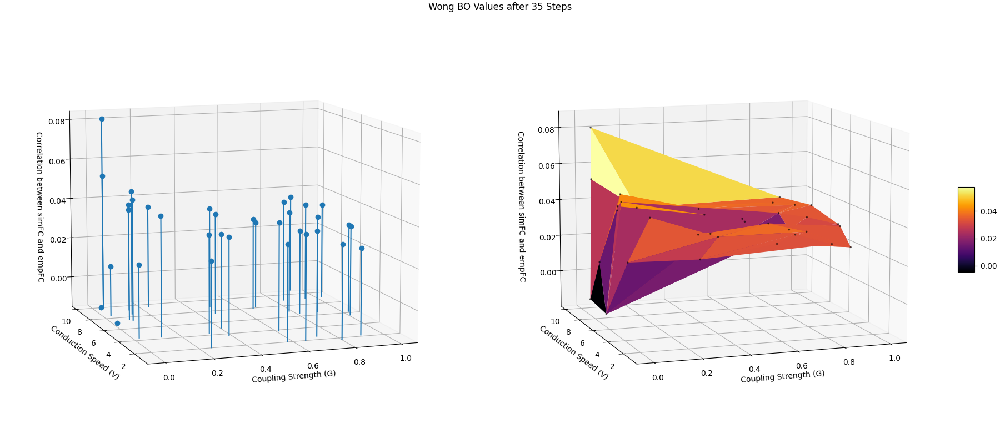

In [ ]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.tri as mtri

# Turn them into numpy arrays
wong_bo_paramsNP = np.array(wong_bo_params)
wong_bo_valuesNP = np.array(wong_bo_values)

# Function to plot the Bayesian Optimization results for every parameter value
def plot_bo_results(bo_params, bo_values, model_name, xlabel, ylabel, zlabel):
    # Get the two parameter values
    x = bo_params[:35, 0]
    y = bo_params[:35, 1]
    # Get the output Bayesian Optimization values
    z = bo_values[:35]

    # Extract the number of iterations of Bayesian Optimization
    steps = len(z)

    # Define the figure and first axis
    # fig = plt.figure(figsize=plt.figaspect(0.5))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8), subplot_kw=dict(projection='3d'), constrained_layout=True)
    # Define the stem object
    ax1.stem(x, y, z, bottom=z.min(), basefmt=" ", orientation='z')
    ax1.view_init(elev=10, azim=-109)
    # Define the triangulation
    triang = mtri.Triangulation(x, y)
    # Plot the triangulation with inferno cmap
    im2 = ax2.plot_trisurf(triang, z, cmap='inferno')
    ax2.scatter(x,y,z, marker='.', s=10, c="black", alpha=0.5)
    ax2.view_init(elev=10, azim=-109)
    # Add a color bar to the plot
    fig.colorbar(im2, shrink=0.2, aspect=5)

    # Give the figure a title
    fig.suptitle('{} BO Values after {} Steps'.format(model_name, steps))
    # Set the labels of the figure
    ax1.set_xlabel('{}'.format(xlabel))
    ax2.set_xlabel('{}'.format(xlabel))
    ax1.set_ylabel('{}'.format(ylabel))
    ax2.set_ylabel('{}'.format(ylabel))
    ax1.set_zlabel('{}'.format(zlabel), labelpad=7)
    ax2.set_zlabel('{}'.format(zlabel), labelpad=14)
    # Set aspects
    ax1.set_aspect('auto')
    ax2.set_aspect('auto')
    
    # Show the plot
    plt.show()

# Define the name of the model and labels
wong_name = 'Wong'
wong_xlabel = 'Coupling Strength (G)'
wong_ylabel = 'Conduction Speed (V)'
wong_zlabel = 'Correlation between simFC and empFC'
# Plot the results of Bayesian Optimization
plot_bo_results(wong_bo_paramsNP, wong_bo_valuesNP,
                wong_name, wong_xlabel, wong_ylabel, wong_zlabel)


### **3 - Jansen-Rit**
The equations for this model are:
$$
\begin{equation}
    \begin{gathered}
        \dot{y_0} &= y_3 
        \\
        \dot{y_3} &= A a\,S[y_1 - y_2] - 2a\,y_3 - a^2\, y_0 
        \\
        \dot{y_1} &= y_4
        \\
        \dot{y_4} &= A a \,[p(t) + \alpha_2 J + S[\alpha_1 J\,y_0]+ c_0]
                    -2a\,y - a^2\,y_1 
        \\
        \dot{y_2} &= y_5 
        \\
        \dot{y_5} &= B b (\alpha_4 J\, S[\alpha_3 J \,y_0]) - 2 b\, y_5
                    - b^2\,y_2 
        \\
        S[v] &= \frac{2\, \nu_{max}}{1 + \exp^{r(v_0 - v)}}
    \end{gathered}
\end{equation}
$$

As before, parameters of the coupling function are what we change. Here, $\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right)$ takes the form of a sigmoidal, specifically 
$$
\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right) = \sum_{j=1}^lu_{kj}\left[c_{min} + \frac{c_{max} - c_{min}} {1 + \exp\left(\frac{-a\mathbf{\Psi}_j\left(t - \tau_{kj}\right) - x_0}{\sigma}\right)}\right]
$$
In code, this is:
```
class SigmoidalJansenRit(Coupling):
    r"""
    Provides a sigmoidal coupling function as described in the 
    Jansen and Rit model, of the following form
    .. math::
        c_{min} + (c_{max} - c_{min}) / (1.0 + \exp(-r(x-midpoint)/\sigma))
    Assumes that x has have two state variables.
    """

    cmin = NArray(
        label=":math:`c_{min}`",
        default=numpy.array([0.0,]),
        domain=Range(lo=-1000.0, hi=1000.0, step=10.0),
        doc="Minimum of the sigmoid function",)

    cmax = NArray(
        label=":math:`c_{max}`",
        default=numpy.array([2.0 * 0.0025,]),
        domain=Range(lo=-1000.0, hi=1000.0, step=10.0),
        doc="Maximum of the sigmoid function",)

    midpoint = NArray(
        label="midpoint",
        default=numpy.array([6.0,]),
        domain=Range(lo=-1000.0, hi=1000.0, step=10.0),
        doc="Midpoint of the linear portion of the sigmoid",)

    r = NArray(
        label=r":math:`r`",
        default=numpy.array([0.56,]),
        domain=Range(lo=0.01, hi=1000.0, step=10.0),
        doc="the steepness of the sigmoidal transformation",)

    a = NArray(
        label=r":math:`a`",
        default=numpy.array([1.0,]),
        domain=Range(lo=0.01, hi=1000.0, step=10.0),
        doc="Scaling of the coupling term",)

    def __str__(self):
        return simple_gen_astr(self, 'cmin cmax midpoint a r')

    def pre(self, x_i, x_j):
        pre = self.cmin + \
              (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))
        return pre[:, numpy.newaxis]

    def post(self, gx):
        return self.a * gx
```
where we typically vary the $a$ and `conduction_speed` parameters, though the rest of the parameters above are also free (but not common to change)

In [ ]:
# Define model parameters
jansen_rit_params = {
        "A": np.array([3.25]),
        "B": np.array([22.0]),
        "a": np.array([0.1]),
        "b": np.array([0.05]),
        "v0": np.array([5.52]),
        "nu_max": np.array([0.0025]),
        "r": np.array([0.56]),
        "J": np.array([135.0]),
        "a_1": np.array([1.0]),
        "a_2": np.array([0.8]),
        "a_3": np.array([0.25]),
        "a_4": np.array([0.25]),
        "p_min": np.array([0.12]),
        "p_max": np.array([0.32]),
        "mu": np.array([0.22])
    }

# Define the model itself
jansen_rit_model = models.JansenRit(**jansen_rit_params)

### *Bayesian Optimization - Parameter Exploration*
In Bayesian Optimization, the idea is to use a surrogate *acquisition function* in order to find the next point to evaluate. Here, we use a specific package that uses a Gaussian process as the surrogate. Bayesian Optimization is particularly suited for optimization of high cost functions, of which this is such a case.

Bayesian optimization works by constructing a posterior distribution of functions (gaussian process) that best describes the function you want to optimize. As the number of observations grows, the posterior distribution improves, and the algorithm becomes more certain of which regions in parameter space are worth exploring and which are not.

As you iterate over and over, the algorithm balances its needs of exploration and exploitation taking into account what it knows about the target function. At each step a Gaussian Process is fitted to the known samples (points previously explored), and the posterior distribution, combined with a exploration strategy (such as UCB (Upper Confidence Bound), or EI (Expected Improvement)), are used to determine the next point that should be explored.

#### *Step 1: Creating the BlackBox Function to Be Optimized*

First, we need to create the costly blackbox function that we optimize over. This is exactly the simulation function, that will do the following:

1. Given a set of parameters, configure the simulator
2. Run a simulation, to get the neural activity results
3. Convert neural activity to BOLD fMRI signal, using the Balloon-Windkessel model
4. Find correlations between BOLD signals for each of the brain regions, to make the simFC
5. Find correlation between simFC and empFC, and maximize this measure

In [ ]:
from bayes_opt import BayesianOptimization, UtilityFunction
from matplotlib import gridspec

*Define the black-box function*

One thing to keep in mind here, is that the BOLD monitor for TVB will sample ONCE every period. For example, since the period for our data is 700ms, then every 700ms, the simulation takes 1 BOLD response sample. Thus, we need to take into consideration BOTH that we ignore the first 20 (samples) * 700 = 14,000 ms of simulation as the transient time, as well as the fact that we need data to analyze afterwards


In [ ]:
import scipy.stats as stats
import scipy.signal as signal
from tqdm import tqdm
import numpy as np

def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

# Defining the black-box function
def black_box_jansen(couplingA, speed):
# def black_box_jansen():
    # For every point, replicate 5 times to get an average measure of what the variability is like, or the spread of correlation. The area
    # with the lowest spread and highest correlation is best. We need to test for both a HIGH RELIABILITY AND HIGH PRECISION!!!!

    # Number of replications
    replications = 1
    # Define a range from 0 -> replications
    frames_list = np.arange(0, replications)

    replication_similarities = []

    ############ PARALLELIZING THE 5 REPETITIONS
    for rep in range(0, replications):
      # Define the monitor
      monitor_raw = monitors.Raw()
      # TR is 700 ms for Dr. Pedro's FC data
      monitor_timeAvg = monitors.TemporalAverage(period=700)
      monitor_bold = monitors.Bold(period=700)

      # Define a sigmoidal coupling function
      # ------------ HAS FREE PARAMETER a THAT WILL BE MODIFIED
      jansen_rit_coupling = coupling.SigmoidalJansenRit(a=np.array(couplingA))

      # Define the conduction speed
      # ------------ HAS FREE PARAMETER speed THAT WILL BE MODIFIED
      conduction_speed = speed

      # Define the integrator, that will solve the dynamic equation
      dt = 0.01
      stdNoise = np.array([1e-4])
      jansen_rit_noise = noise.Additive(nsig=stdNoise, noise_seed=np.random.randint(1, 1000000))
      jansen_rit_integrator = integrators.HeunStochastic(dt=dt, noise=jansen_rit_noise)

      # Define the simulation length - remember that we ignore the first 20 * TR (700) = 14000
      TR = 700
      multiple_TR = 40
      simulation_len = multiple_TR * TR

      jansen_rit_simulator = simulator.Simulator(
          model=jansen_rit_model,
          connectivity=structuralConnec,
          conduction_speed=conduction_speed,
          coupling=jansen_rit_coupling,
          integrator=jansen_rit_integrator,
          monitors=(monitor_raw, monitor_timeAvg, monitor_bold),
          simulation_length=simulation_len
      )
      jansen_rit_simulator.configure()

      ################################################################## RUNNING SIMULATION

      # 2. Run a simulation to get ALL 3 types of results
      # 2.1 Perform the simulation
      tic = time.time()
      (jansen_raw_time, jansen_raw_data), (jansen_tavg_time, jansen_tavg_data), (jansen_bold_time, jansen_bold_data) = jansen_rit_simulator.run()
      print('simulation required %0.3f seconds.' % (time.time()-tic))
      
      ################################################################## SAVING RESULTS OF SIMULATION

      # 2.3 Save the results
      if colab:
          jansen_folder = r'/content/drive/MyDrive/tvb_comparison/jansen/replication{}'.format(rep)
          new_jansen_folder = r'/content/drive/MyDrive/tvb_comparison/jansen/replication{}'.format(rep)
      else:
          jansen_folder = r'D:\\ISO_CODE\\jansen\\replication{}'.format(rep)
          new_jansen_folder = r'D:\\ISO_CODE\\jansen\\replication{}'.format(rep)
      i = 1
      # If folder for results exists, change name until name doesnt exist
      while os.path.exists(new_jansen_folder):
          new_jansen_folder = jansen_folder + str(i)
          i += 1
      os.makedirs(new_jansen_folder)

      np.save(os.path.join(new_jansen_folder, 'tavg_time.npy'), jansen_tavg_time)
      np.save(os.path.join(new_jansen_folder, 'tavg_data.npy'), jansen_tavg_data)
      np.save(os.path.join(new_jansen_folder, 'bold_time.npy'), jansen_bold_time)
      np.save(os.path.join(new_jansen_folder, 'bold_data.npy'), jansen_bold_data)

      ################################################################## FORMATTING BOLD AND FINDING ORDER

      # 3. Given BOLD signal, find correlation between to make simFC
      # 3.1 Concatenate across axes to get it in correct shape
      jansen_bold = np.concatenate(jansen_bold_data, axis=0)
      jansen_bold = np.concatenate(jansen_bold, axis=1)
      # 3.2 Ignore transient part
      jansen_bold = np.delete(jansen_bold, np.s_[0:20], axis=1)
      # 3.2 GSR signal
      # Get the signal mean to regress it out of signal
      bold_sigMean = np.mean(jansen_bold, axis=0)
      bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
      # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
      hundred_ones = np.ones((100, 1))
      # Matrix multiplitcation to get repeated matrix
      bold_sigMean = hundred_ones @ bold_sigMean
      # GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
      # regress new signal from old one
      bold_regressed = jansen_bold - bold_sigMean
      ###### BANDPASS FILTER 0.01 -> 0.1
      bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)

      ################################################################## FINDING CORRELATION simFC, empFC

      # 3.3 z-score signal
      jansen_b_z = stats.zscore(bold_filtered)
      # 3.4 Find correlations between different brain regions
      jansen_simFC = np.corrcoef(jansen_b_z)
      np.fill_diagonal(jansen_simFC, 0.0)
      np.save(os.path.join(new_jansen_folder, 'FC_matrix.npy'), jansen_simFC)

      # 4. Find correlation between simFC and empFC (Pearson coefficient)
      # 4.1 Retrieve the upper triangular parts of both matrices
      functionalConnecMean = np.load(functionalConnecMean_path, allow_pickle=True)
      jansen_corr = np.corrcoef(jansen_simFC.flatten(), functionalConnecMean.flatten())
      jansen_similarity = jansen_corr[0, 1]
      # 4.1 Save the found correlation
      np.save(os.path.join(new_jansen_folder, 'simFC_empFC_corr.npy'), jansen_similarity)

      replication_similarities.append(jansen_similarity)
      print(replication_similarities)

    # Save results in the appropriate folders - if folder exists, create another
    i = 0
    if colab:
        jansen_folder = r'/content/drive/MyDrive/tvb_comparison/jansen/replicationResults{}'.format(i)
        new_jansen_folder = r'/content/drive/MyDrive/tvb_comparison/jansen/replicationResults{}'.format(i)
    else:
        jansen_folder = r'D:\\ISO_CODE\\jansen\\replicationResults{}'.format(i)
        new_jansen_folder = r'D:\\ISO_CODE\\jansen\\replicationResults{}'.format(i)
    while os.path.exists(new_jansen_folder):
        new_jansen_folder = jansen_folder + str(i)
        i += 1
    os.makedirs(new_jansen_folder)

    # Save across-test FCs
    np.save(os.path.join(new_jansen_folder, 'replication_similarities.npy'), np.array(replication_similarities))

    return replication_similarities[-1]

#### *Step 2: Define Parameter Bounds and Optimize*

*Define bounds and optimizer*

In [ ]:
# Defining parameter bounds for the function
parameter_bounds = {'couplingA': (1.0, 10.0), 'speed': (5., 20.)}

# Defining the Bayesian Optimization object
optimizer = BayesianOptimization(
    f=black_box_jansen,
    pbounds=parameter_bounds,
    verbose=2,
    random_state=987234
)

*Define acquisition function and maximize*

This function does the actual maximization of the objective function, and takes two parameters: 
1. `n_iter`: Number of steps of BO to perform (the more the better)
2. `init_points`: Number of random exploration steps

In [ ]:
n_iter_BO = 35
n_init = 1

In [ ]:
# Defining the BO acquisition function
acquisition_function = UtilityFunction(kind="ei",xi=1e-1)

# Run the actual optimization
optimizer.maximize(
    n_iter=n_iter_BO,
    init_points=n_init,
    acquisition_function=acquisition_function
)

|   iter    |  target   | couplingA |   speed   |
-------------------------------------------------
WARNING  random_state supplied for non-stochastic integration
simulation required 1285.069 seconds.
corr shape (2, 2)
[0.025128710973548535]
| 2         | 0.02513   | 3.034     | 5.537     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1281.162 seconds.
corr shape (2, 2)
[0.05604523923580407]
| 3         | 0.05605   | 7.807     | 18.27     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1251.990 seconds.
corr shape (2, 2)
[0.03666036920343613]
| 4         | 0.03666   | 9.962     | 11.35     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1284.064 seconds.
corr shape (2, 2)
[0.03721047711421336]
| 5         | 0.03721   | 9.974     | 5.083     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1259.789 seconds.
corr shape (2, 2)
[0.05224745914662935]
| 6         | 0.05225   | 1.178     | 19.99     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1259.693 seconds.
corr shape (2, 2)
[-0.011333428244619359]
| 7         | -0.01133  | 1.007     | 10.35     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1286.991 seconds.
corr shape (2, 2)
[0.036843119125631214]
| 8         | 0.03684   | 4.952     | 19.98     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1335.621 seconds.
corr shape (2, 2)
[0.04484903909214787]
| 9         | 0.04485   | 6.539     | 14.56     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1316.208 seconds.
corr shape (2, 2)
[0.034836516379308326]
| 10        | 0.03484   | 9.974     | 15.85     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1286.827 seconds.
corr shape (2, 2)
[0.04732343701124779]
| 11        | 0.04732   | 9.989     | 19.93     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1270.896 seconds.
corr shape (2, 2)
[0.03167724462424515]
| 12        | 0.03168   | 6.794     | 8.55      |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1293.402 seconds.
corr shape (2, 2)
[0.046576474769463354]
| 13        | 0.04658   | 6.455     | 5.023     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1254.998 seconds.
corr shape (2, 2)
[0.04047375979587136]
| 14        | 0.04047   | 4.791     | 11.95     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1291.629 seconds.
corr shape (2, 2)
[0.019725898592423387]
| 15        | 0.01973   | 4.907     | 16.97     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1289.244 seconds.
corr shape (2, 2)
[0.05682696486868414]
| 16        | 0.05683   | 8.737     | 18.79     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1234.579 seconds.
corr shape (2, 2)
[0.037316742838104315]
| 17        | 0.03732   | 9.996     | 8.267     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1255.280 seconds.
corr shape (2, 2)
[0.006887772031208136]
| 18        | 0.006888  | 1.003     | 13.9      |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1241.375 seconds.
corr shape (2, 2)
[0.03208568912361721]
| 19        | 0.03209   | 7.433     | 12.06     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1255.291 seconds.
corr shape (2, 2)
[0.007461122293572009]
| 20        | 0.007461  | 1.022     | 18.01     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1236.582 seconds.
corr shape (2, 2)
[0.033718534519999434]
| 21        | 0.03372   | 7.609     | 19.8      |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1278.215 seconds.
corr shape (2, 2)
[0.059148097482959405]
| 22        | 0.05915   | 9.034     | 17.44     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1293.465 seconds.
corr shape (2, 2)
[0.03904560332129654]
| 23        | 0.03905   | 7.761     | 16.37     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1330.632 seconds.
corr shape (2, 2)
[0.04444184597157506]
| 24        | 0.04444   | 8.113     | 6.413     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1317.185 seconds.
corr shape (2, 2)
[0.04869464262344691]
| 25        | 0.04869   | 4.206     | 14.15     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1284.140 seconds.
corr shape (2, 2)
[0.00567314377741473]
| 26        | 0.005673  | 2.809     | 19.98     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1298.599 seconds.
corr shape (2, 2)
[0.0541669163163358]
| 27        | 0.05417   | 9.953     | 18.35     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1275.615 seconds.
corr shape (2, 2)
[0.05094123575846837]
| 28        | 0.05094   | 5.372     | 6.709     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1247.723 seconds.
corr shape (2, 2)
[0.05211093106048613]
| 29        | 0.05211   | 4.136     | 8.321     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1265.909 seconds.
corr shape (2, 2)
[0.022238252780427722]
| 30        | 0.02224   | 4.727     | 9.902     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1228.911 seconds.
corr shape (2, 2)
[0.025311057244592677]
| 31        | 0.02531   | 2.498     | 7.906     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1273.193 seconds.
corr shape (2, 2)
[0.03420046864417705]
| 32        | 0.0342    | 8.707     | 13.99     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1270.073 seconds.
corr shape (2, 2)
[0.03370775126688905]
| 33        | 0.03371   | 8.623     | 9.791     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1263.179 seconds.
corr shape (2, 2)
[0.04294840539861386]
| 34        | 0.04295   | 1.074     | 5.025     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1262.271 seconds.
corr shape (2, 2)
[0.047779526974344046]
| 35        | 0.04778   | 3.066     | 12.67     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1257.875 seconds.
corr shape (2, 2)
[0.047359456680867926]
| 36        | 0.04736   | 4.919     | 5.007     |
WARNING  random_state supplied for non-stochastic integration


/usr/local/lib/python3.10/dist-packages/numba/np/ufunc/gufunc.py:170: RuntimeWarning: overflow encountered in _numba_dfun_jr
  return self.ufunc(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/tvb/simulator/coupling.py:372: RuntimeWarning: overflow encountered in exp
  (self.cmax - self.cmin) / (1.0 + numpy.exp(self.r * (self.midpoint - (x_j[:, 0] - x_j[:, 1]))))


simulation required 1286.161 seconds.
corr shape (2, 2)
[0.031524345400013684]
| 37        | 0.03152   | 3.352     | 15.36     |


#### *Step 3: Examine Results*
Now that we've run Bayesian Optimization and have some measure of the best parameters for the model, we can extract the top combinations, to visualize the results in nice plots

*Get results of iterations from Bayesian Optimization*

In [ ]:
# Define the lists that will store the results of Bayesian Optimization
jansen_bo_values = []
jansen_bo_params = []

# For every run of Bayesian Optimization
for i, res in enumerate(optimizer.res):
    # Get the values of each iteration
    jansen_bo_values.append(res['target'])
    # Get the parameter values
    jansen_bo_params.append(
        [res['params']['couplingA'], res['params']['speed']])

# Save the BO values
if colab:
    main_jansen_folder = '/content/drive/MyDrive/tvb_comparison/jansenResults/'
else:
    main_jansen_folder = r'D:\\ISO_CODE\\jansen'

if not os.path.exists(main_jansen_folder):
    os.makedirs(main_jansen_folder)

np.save(os.path.join(main_jansen_folder, 'jansen_bo_values.npy'),
        np.array(jansen_bo_values))
np.save(os.path.join(main_jansen_folder, 'jansen_bo_params.npy'),
        np.array(jansen_bo_params))


In [ ]:
def posterior(optimizer, x_obs, y_obs, grid):
    optimizer._gp.fit(x_obs, y_obs)

    mu, sigma = optimizer._gp.predict(grid, return_std=True)
    return mu, sigma

def plot_gp(optimizer, x, given_lim, name):
    fig = plt.figure(figsize=(16, 10))
    steps = len(optimizer.space)
    fig.suptitle(
        'Gaussian Process and Utility Function After {} Steps'.format(steps),
        fontdict={'size':30}
    )
    
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1]) 
    axis = plt.subplot(gs[0])
    acq = plt.subplot(gs[1])
    
    x_obs = np.array([[res["params"][name]] for res in optimizer.res])
    y_obs = np.array([res["target"] for res in optimizer.res])
    
    mu, sigma = posterior(optimizer, x_obs, y_obs, x)
    # axis.plot(x, y, linewidth=3, label='Target')
    axis.plot(x_obs.flatten(), y_obs, 'D', markersize=8, label=u'Observations', color='r')
    axis.plot(x, mu, '--', color='k', label='Prediction')

    axis.fill(np.concatenate([x, x[::-1]]), 
              np.concatenate([mu - 1.9600 * sigma, (mu + 1.9600 * sigma)[::-1]]),
        alpha=.6, fc='c', ec='None', label='95% confidence interval')
    
    axis.set_xlim(given_lim)
    axis.set_ylim((None, None))
    axis.set_ylabel('f(x)', fontdict={'size':20})
    axis.set_xlabel('x', fontdict={'size':20})
    
    utility_function = UtilityFunction(kind="ucb", kappa=5, xi=0)
    utility = utility_function.utility(x, optimizer._gp, 0)
    acq.plot(x, utility, label='Utility Function', color='purple')
    acq.plot(x[np.argmax(utility)], np.max(utility), '*', markersize=15, 
             label=u'Next Best Guess', markerfacecolor='gold', markeredgecolor='k', markeredgewidth=1)
    acq.set_xlim(given_lim)
    acq.set_ylim((0, np.max(utility) + 0.5))
    acq.set_ylabel('Utility', fontdict={'size':20})
    acq.set_xlabel('x', fontdict={'size':20})
    
    axis.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)
    acq.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)

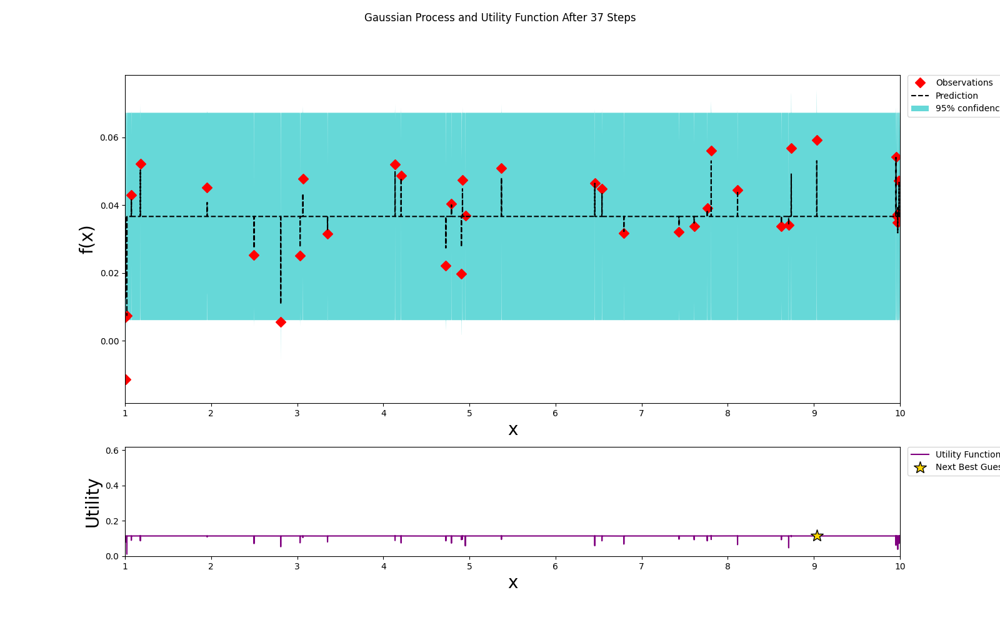

In [ ]:
coup = np.linspace(1.0, 10.0, 10000).reshape(-1, 1)
plot_gp(optimizer, coup, (1.0, 10.0), "couplingA")

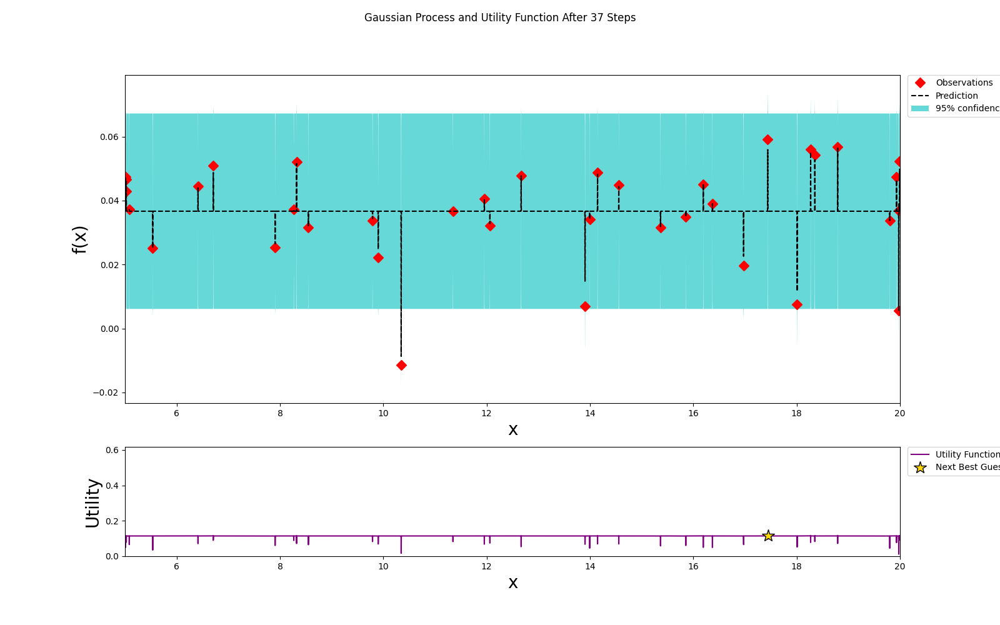

In [ ]:
spd = np.linspace(5., 20., 10000).reshape(-1, 1)
plot_gp(optimizer, spd, (5., 20.), "speed")

In [ ]:
if colab:
    main_jansen_folder = '/content/drive/MyDrive/tvb_comparison/jansenResults/'
else:
    main_jansen_folder = r'D:\\ISO_CODE\\jansen'
    
# Load the results of Bayesian Optimization
jansen_bo_params = np.load(os.path.join(main_jansen_folder, 'jansen_bo_params.npy'))
jansen_bo_values = np.load(os.path.join(main_jansen_folder, 'jansen_bo_values.npy'))

*Define helper functions for visualization*

Maybe add another for the GP?

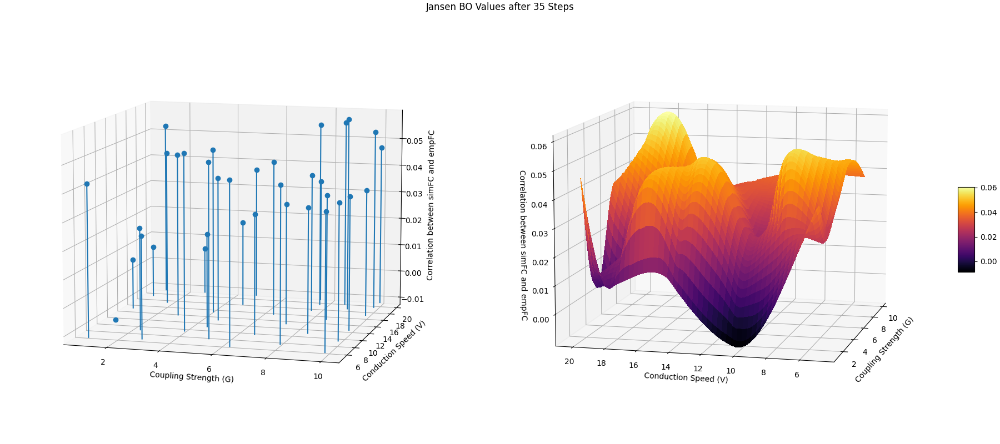

In [ ]:
# Turn them into numpy arrays
jansen_bo_paramsNP = np.array(jansen_bo_params)
jansen_bo_valuesNP = np.array(jansen_bo_values)

import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Function to plot the Bayesian Optimization results for every parameter value
def plot_bo_results(bo_params, bo_values, model_name, xlabel, ylabel, zlabel):
    # Extract the number of iterations of Bayesian Optimization
    steps = len(bo_values[:35])

    # Get the two parameter values
    x = bo_params[:35, 0]
    y = bo_params[:35, 1]
    # Get the output Bayesian Optimization values
    z = bo_values[:35]

    # Define the figure and first axis
    # fig = plt.figure(figsize=plt.figaspect(0.5))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8), subplot_kw=dict(projection='3d'), constrained_layout=True)
    # Define the min, max of the data
    xi = np.linspace(x.min(),x.max(),100)
    yi = np.linspace(y.min(),y.max(),100)
    # VERY IMPORTANT, to tell matplotlib how is your data organized
    zi = griddata((x, y), z, (xi[None,:], yi[:,None]), method='cubic')
    # Define the stem object
    ax1.stem(x, y, z, bottom=z.min(), basefmt=" ", orientation='z')
    ax1.view_init(elev=10, azim=-74)

    # Create a meshgrid
    xig, yig = np.meshgrid(xi, yi)
    # Define the surface object to plot
    surf = ax2.plot_surface(xig, yig, zi, linewidth=0, cmap='inferno', antialiased=False)
    # Add a color bar to the plot
    fig.colorbar(surf, shrink=0.2, aspect=5)
    ax2.view_init(elev=10, azim=-166)

    # Give the figure a title
    fig.suptitle('{} BO Values after {} Steps'.format(model_name, steps))
    # Set the labels of the figure
    ax1.set_xlabel('{}'.format(xlabel))
    ax2.set_xlabel('{}'.format(xlabel))
    ax1.set_ylabel('{}'.format(ylabel))
    ax2.set_ylabel('{}'.format(ylabel))
    ax1.set_zlabel('{}'.format(zlabel), labelpad=7)
    ax2.set_zlabel('{}'.format(zlabel))
    # Set aspects
    ax1.set_aspect('auto')
    ax2.set_aspect('auto')
    
    # Show the plot
    plt.show()
    
# Define the name of the model and labels
jansen_name = 'Jansen'
jansen_xlabel = 'Coupling Strength (G)'
jansen_ylabel = 'Conduction Speed (V)'
jansen_zlabel = 'Correlation between simFC and empFC'
# Plot the results of Bayesian Optimization
plot_bo_results(jansen_bo_paramsNP, jansen_bo_valuesNP,
                jansen_name, jansen_xlabel, jansen_ylabel, jansen_zlabel)


### **4 - Larter-Breakspear**
The equations for this model are:
$$
\begin{equation}
    \begin{gathered}
        \dot{V}_k & = - (g_{Ca} + (1 - C) \, r_{NMDA} \, a_{ee} \, Q_V + C \, r_{NMDA} \, a_{ee} \, \langle Q_V\rangle^{k}) \, m_{Ca} \, (V - VCa) \\
                           & \,\,- g_K \, W \, (V - VK) -  g_L \, (V - VL) \\
                           & \,\,- (g_{Na} \, m_{Na} + (1 - C) \, a_{ee} \, Q_V + C \, a_{ee} \, \langle Q_V\rangle^{k}) \,(V - VNa) \\
                           & \,\,- a_{ie} \, Z \, Q_Z + a_{ne} \, I \\
                           & \\
            \dot{W}_k & = \phi \, \dfrac{m_K - W}{\tau_{K}} \\
                           & \nonumber\\
            \dot{Z}_k &= b (a_{ni}\, I + a_{ei}\,V\,Q_V) \\
            Q_{V}   &= Q_{V_{max}} \, (1 + \tanh\left(\dfrac{V_{k} - VT}{\delta_{V}}\right)) \\
            Q_{Z}   &= Q_{Z_{max}} \, (1 + \tanh\left(\dfrac{Z_{k} - ZT}{\delta_{Z}}\right))
    \end{gathered}
\end{equation}
$$

For $\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right)$, this function uses a hyperbolic tangent, in which:
$$
\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right) = a \left[\sum_{j=1}^l u_{kj} b \left(1 + \tanh\left(\frac{\mathbf{\Psi}_j\left(t - \tau_{kj}\right) - c}{d}\right)\right)\right]
$$
In code, this looks like:
```
class HyperbolicTangent(SparseCoupling):
    r"""
    Provides a sigmoidal coupling function of the form
    .. math::
        a * (1 + tanh((x - midpoint)/sigma))
    NB: This coupling function is applied pre-summation. For a post-summation
        sigmoidal, see `Sigmoidal`.
    """

    a = NArray(
        label=":math:`a`",
        default=numpy.array([1.0]),
        domain=Range(lo=-1000.0, hi=1000.0, step=10.0),
        doc="Minimum of the sigmoid function")

    b = NArray(
        label=":math:`b`",
        default=numpy.array([1.0]),
        domain=Range(lo=-1.0, hi=1.0, step=10.0),
        doc="Scaling factor for the variable")

    midpoint = NArray(
        label="midpoint",
        default=numpy.array([0.0,]),
        domain=Range(lo=-1000.0, hi=1000.0, step=10.0),
        doc="Midpoint of the linear portion of the sigmoid")

    sigma = NArray(
        label=r":math:`\sigma`",
        default=numpy.array([1.0,]),
        domain=Range(lo=0.01, hi=1000.0, step=10.0),
        doc="Standard deviation of the coupling")

    def pre(self, x_i, x_j):
        return self.a * (1 +  numpy.tanh((self.b * x_j - self.midpoint) / self.sigma))

    def __str__(self):
        return simple_gen_astr(self, 'a b midpoint sigma')
```
where we change the `conduction_speed`, scaling factor $b$, and $\sigma$

In [ ]:
# Define model parameters
larter_breakspear_params = {
        "gCa": np.array([1.1]),
        "gK": np.array([2.0]),
        "gL": np.array([0.5]),
        "phi": np.array([0.7]),
        "gNa": np.array([6.7]),
        "TK": np.array([0.0]),
        "TCa": np.array([-0.01]),
        "TNa": np.array([0.3]),
        "VCa": np.array([1.0]),
        "VK": np.array([-0.7]),
        "VL": np.array([-0.5]),
        "VNa": np.array([0.53]),
        "d_K": np.array([0.3]),
        "tau_K": np.array([1.0]),
        "d_Na": np.array([0.15]),
        "d_Ca": np.array([0.15]),
        "aei": np.array([2.0]),
        "aie": np.array([2.0]),
        "b": np.array([0.1]),
        "C": np.array([0.1]),
        "ane": np.array([0.05]),
        "ani": np.array([0.05]),
        "aee": np.array([0.4]),
        "Iext": np.array([0.3]),
        "rNMDA": np.array([0.25]),
        "VT": np.array([0.01]),
        "d_V": np.array([0.65]),
        "ZT": np.array([0.0]),
        "d_Z": np.array([0.7]),
        "QV_max": np.array([1.0]),
        "QZ_max": np.array([1.0]),
        "t_scale": np.array([1.0])
    }

# Define the model itself
larter_breakspear_model = models.LarterBreakspear(**larter_breakspear_params)

### *Bayesian Optimization - Parameter Exploration*
In Bayesian Optimization, the idea is to use a surrogate *acquisition function* in order to find the next point to evaluate. Here, we use a specific package that uses a Gaussian process as the surrogate. Bayesian Optimization is particularly suited for optimization of high cost functions, of which this is such a case.

Bayesian optimization works by constructing a posterior distribution of functions (gaussian process) that best describes the function you want to optimize. As the number of observations grows, the posterior distribution improves, and the algorithm becomes more certain of which regions in parameter space are worth exploring and which are not.

As you iterate over and over, the algorithm balances its needs of exploration and exploitation taking into account what it knows about the target function. At each step a Gaussian Process is fitted to the known samples (points previously explored), and the posterior distribution, combined with a exploration strategy (such as UCB (Upper Confidence Bound), or EI (Expected Improvement)), are used to determine the next point that should be explored.

#### *Step 1: Creating the BlackBox Function to Be Optimized*

First, we need to create the costly blackbox function that we optimize over. This is exactly the simulation function, that will do the following:

1. Given a set of parameters, configure the simulator
2. Run a simulation, to get the neural activity results
3. Convert neural activity to BOLD fMRI signal, using the Balloon-Windkessel model
4. Find correlations between BOLD signals for each of the brain regions, to make the simFC
5. Find correlation between simFC and empFC, and maximize this measure

In [ ]:
from bayes_opt import BayesianOptimization, UtilityFunction
from matplotlib import gridspec

*Define the black-box function*

One thing to keep in mind here, is that the BOLD monitor for TVB will sample ONCE every period. For example, since the period for our data is 700ms, then every 700ms, the simulation takes 1 BOLD response sample. Thus, we need to take into consideration BOTH that we ignore the first 20 (samples) * 700 = 14,000 ms of simulation as the transient time, as well as the fact that we need data to analyze afterwards


In [ ]:
import scipy.stats as stats
import scipy.signal as signal
from tqdm import tqdm
import numpy as np

def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

# Defining the black-box function
def black_box_larter(couplingB, couplingS, speed):
    # For every point, replicate 5 times to get an average measure of what the variability is like, or the spread of correlation. The area
    # with the lowest spread and highest correlation is best. We need to test for both a HIGH RELIABILITY AND HIGH PRECISION!!!!

    # Number of replications
    replications = 1
    # Define a range from 0 -> replications
    frames_list = np.arange(0, replications)

    replication_similarities = []

    ############ PARALLELIZING THE 5 REPETITIONS
    for rep in range(0, replications):
      # Define the monitor
      monitor_raw = monitors.Raw()
      # TR is 700 ms for Dr. Pedro's FC data
      monitor_timeAvg = monitors.TemporalAverage(period=700)
      monitor_bold = monitors.Bold(period=700)

      # Define a sigmoidal coupling function
      # ------------ HAS FREE PARAMETER a THAT WILL BE MODIFIED
      larter_break_coupling = coupling.HyperbolicTangent(b=np.array(couplingB), sigma=np.array(couplingS))

      # Define the conduction speed
      # ------------ HAS FREE PARAMETER speed THAT WILL BE MODIFIED
      conduction_speed = speed

      # Define the integrator, that will solve the dynamic equation
      dt = 0.01
      stdNoise = np.array([1e-4])
      larter_break_noise = noise.Additive(
          nsig=stdNoise, noise_seed=np.random.randint(1, 1000000))
      larter_break_integrator = integrators.HeunStochastic(
          dt=dt, noise=larter_break_noise)

      # Define the simulation length - remember that we ignore the first 20 * TR (700) = 14000
      TR = 700
      multiple_TR = 40
      simulation_len =  multiple_TR * TR

      larter_break_simulator = simulator.Simulator(
          model=larter_breakspear_model,
          connectivity=structuralConnec,
          conduction_speed=conduction_speed,
          coupling=larter_break_coupling,
          integrator=larter_break_integrator,
          monitors=(monitor_raw, monitor_timeAvg, monitor_bold),
          simulation_length=simulation_len
      )
      larter_break_simulator.configure()

      # RUNNING SIMULATION

      # 2. Run a simulation to get ALL 3 types of results
      # 2.1 Perform the simulation
      tic = time.time()
      (larter_raw_time, larter_raw_data), (larter_tavg_time, larter_tavg_data), (larter_bold_time, larter_bold_data) = larter_break_simulator.run()
      print('simulation required %0.3f seconds.' % (time.time()-tic))

      ################################################################## SAVING RESULTS OF SIMULATION
      
      # 2.3 Save the results
      if colab:
          larter_folder = r'/content/drive/MyDrive/tvb_comparison/larter/replication{}'.format(rep)
          new_larter_folder = r'/content/drive/MyDrive/tvb_comparison/larter/replication{}'.format(rep)
      else:
          larter_folder = r'D:\\ISO_CODE\\larter\\replication{}'.format(rep)
          new_larter_folder = r'D:\\ISO_CODE\\larter\\replication{}'.format(rep)
      i = 1
      # If folder for results exists, change name until name doesnt exist
      while os.path.exists(new_larter_folder):
          new_larter_folder = larter_folder + str(i)
          i += 1
      os.makedirs(new_larter_folder)

      np.save(os.path.join(new_larter_folder, 'tavg_time.npy'), larter_tavg_time)
      np.save(os.path.join(new_larter_folder, 'tavg_data.npy'), larter_tavg_data)
      np.save(os.path.join(new_larter_folder, 'bold_time.npy'), larter_bold_time)
      np.save(os.path.join(new_larter_folder, 'bold_data.npy'), larter_bold_data)

      ################################################################## FORMATTING BOLD AND FINDING ORDER

      # 3. Given BOLD signal, find correlation between to make simFC
      # 3.1 Concatenate across axes to get it in correct shape
      larter_bold = np.concatenate(larter_bold_data, axis=0)
      larter_bold = np.concatenate(larter_bold, axis=1)
      # 3.2 Ignore transient part
      larter_bold = np.delete(larter_bold, np.s_[0:20], axis=1)
      # 3.2 GSR signal
      # Get the signal mean to regress it out of signal
      bold_sigMean = np.mean(larter_bold, axis=0)
      bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
      # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
      hundred_ones = np.ones((100, 1))
      # Matrix multiplitcation to get repeated matrix
      bold_sigMean = hundred_ones @ bold_sigMean
      # GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
      # regress new signal from old one
      bold_regressed = larter_bold - bold_sigMean
      ###### BANDPASS FILTER 0.01 -> 0.1
      bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)

      ################################################################## FINDING CORRELATION BETWEEN BOLD FOR simFC

      # 3.3 z-score signal
      larter_b_z = stats.zscore(bold_filtered)
      # 3.4 Find correlations between different brain regions
      larter_simFC = np.corrcoef(larter_b_z)
      np.fill_diagonal(larter_simFC, 0.0)
      np.save(os.path.join(new_larter_folder, 'FC_matrix.npy'), larter_simFC)

      ################################################################## FINDING CORRELATION simFC, empFC

      # 4. Find correlation between simFC and empFC (Pearson coefficient)
      # 4.1 Retrieve the upper triangular parts of both matrices
      functionalConnecMean = np.load(functionalConnecMean_path, allow_pickle=True)
      larter_corr = np.corrcoef(larter_simFC.flatten(), functionalConnecMean.flatten())
      larter_similarity = larter_corr[0, 1]
      # 4.1 Save the found correlation
      np.save(os.path.join(new_larter_folder, 'simFC_empFC_corr.npy'), larter_similarity)
      # Save the replication similarities
      replication_similarities.append(larter_similarity)
      print(replication_similarities)

    # Save results in the appropriate folders - if folder exists, create another
    i = 0
    if colab:
        larter_folder = r'/content/drive/MyDrive/tvb_comparison/larter/replicationResults{}'.format(i)
        new_larter_folder = r'/content/drive/MyDrive/tvb_comparison/larter/replicationResults{}'.format(i)
    else:
        larter_folder = r'D:\\ISO_CODE\\larter\\replicationResults{}'.format(i)
        new_larter_folder = r'D:\\ISO_CODE\\larter\\replicationResults{}'.format(i)
    while os.path.exists(new_larter_folder):
        new_larter_folder = larter_folder + str(i)
        i += 1
    os.makedirs(new_larter_folder)

    # Save across-test FCs
    np.save(os.path.join(new_larter_folder, 'replication_similarities.npy'), np.array(replication_similarities))

    return replication_similarities[-1]

#### *Step 2: Define Parameter Bounds and Optimize*

*Define bounds and optimizer*

In [ ]:
# Defining parameter bounds for the function
parameter_bounds = {'couplingB': (-1.0, 1.0), 'couplingS': (0.01, 1000.0), 'speed': (1., 10.)}

# Defining the Bayesian Optimization object
optimizer = BayesianOptimization(
    f=black_box_larter,
    pbounds=parameter_bounds,
    verbose=2,
    random_state=987234
)

*Define acquisition function and maximize*

This function does the actual maximization of the objective function, and takes two parameters: 
1. `n_iter`: Number of steps of BO to perform (the more the better)
2. `init_points`: Number of random exploration steps

In [ ]:
n_iter_BO = 35
n_init = 1

In [ ]:
# Defining the BO acquisition function
acquisition_function = UtilityFunction(kind="ei",xi=1e-1)

# Run the actual optimization
optimizer.maximize(
    n_iter=n_iter_BO,
    init_points=n_init,
    acquisition_function=acquisition_function
)

|   iter    |  target   | couplingB | couplingS |   speed   |
-------------------------------------------------------------
simulation required 1788.960 seconds.
[-0.017920682061056546]
| 1         | -0.01792  | -0.9284   | 176.3     | 1.863     |
simulation required 1817.017 seconds.
[0.011044204502185215]
| 2         | 0.01104   | -0.6927   | 162.2     | 8.07      |
simulation required 1790.767 seconds.
[0.008383881011451847]
| 3         | 0.008384  | 0.1469    | 360.2     | 4.21      |
simulation required 1817.103 seconds.
[-0.0026749036695149406]
| 4         | -0.002675 | -0.4525   | 78.78     | 7.008     |
simulation required 1775.733 seconds.
[0.0003496146499417027]
| 5         | 0.0003496 | -0.3246   | 514.8     | 3.779     |
simulation required 1803.483 seconds.
[-0.011531834914975303]
| 6         | -0.01153  | -0.6426   | 823.6     | 6.889     |
simulation required 1774.369 seconds.
[0.013219328511636359]
| 7         | 0.01322   | 0.2182    | 909.1     | 1.954     |
simulation

KeyboardInterrupt: ignored

#### *Step 3: Examine Results*
Now that we've run Bayesian Optimization and have some measure of the best parameters for the model, we can extract the top combinations, to visualize the results in nice plots

*Get results of iterations from Bayesian Optimization*

In [ ]:
# Define the lists that will store the results of Bayesian Optimization
larter_bo_values = []
larter_bo_params = []

# For every run of Bayesian Optimization
for i, res in enumerate(optimizer.res):
    # Get the values of each iteration
    larter_bo_values.append(res['target'])
    # Get the parameter values
    larter_bo_params.append(
        [res['params']['couplingB'], res['params']['couplingS'], res['params']['speed']])

# Save the BO values
if colab:
    main_larter_folder = '/content/drive/MyDrive/tvb_comparison/larterResults/'
else:
    main_larter_folder = r'D:\\ISO_CODE\\larter'

if not os.path.exists(main_larter_folder):
    os.makedirs(main_larter_folder)

np.save(os.path.join(main_larter_folder, 'larter_bo_values.npy'),
        np.array(larter_bo_values))
np.save(os.path.join(main_larter_folder, 'larter_bo_params.npy'),
        np.array(larter_bo_params))


In [ ]:
def posterior(optimizer, x_obs, y_obs, grid):
    optimizer._gp.fit(x_obs, y_obs)

    mu, sigma = optimizer._gp.predict(grid, return_std=True)
    return mu, sigma

def plot_gp(optimizer, x, given_lim, name):
    fig = plt.figure(figsize=(16, 10))
    steps = len(optimizer.space)
    fig.suptitle(
        'Gaussian Process and Utility Function After {} Steps'.format(steps),
        fontdict={'size':30}
    )
    
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1]) 
    axis = plt.subplot(gs[0])
    acq = plt.subplot(gs[1])
    
    x_obs = np.array([[res["params"][name]] for res in optimizer.res])
    y_obs = np.array([res["target"] for res in optimizer.res])
    
    mu, sigma = posterior(optimizer, x_obs, y_obs, x)
    # axis.plot(x, y, linewidth=3, label='Target')
    axis.plot(x_obs.flatten(), y_obs, 'D', markersize=8, label=u'Observations', color='r')
    axis.plot(x, mu, '--', color='k', label='Prediction')

    axis.fill(np.concatenate([x, x[::-1]]), 
              np.concatenate([mu - 1.9600 * sigma, (mu + 1.9600 * sigma)[::-1]]),
        alpha=.6, fc='c', ec='None', label='95% confidence interval')
    
    axis.set_xlim(given_lim)
    axis.set_ylim((None, None))
    axis.set_ylabel('f(x)', fontdict={'size':20})
    axis.set_xlabel('x', fontdict={'size':20})
    
    utility_function = UtilityFunction(kind="ucb", kappa=5, xi=0)
    utility = utility_function.utility(x, optimizer._gp, 0)
    acq.plot(x, utility, label='Utility Function', color='purple')
    acq.plot(x[np.argmax(utility)], np.max(utility), '*', markersize=15, 
             label=u'Next Best Guess', markerfacecolor='gold', markeredgecolor='k', markeredgewidth=1)
    acq.set_xlim(given_lim)
    acq.set_ylim((0, np.max(utility) + 0.5))
    acq.set_ylabel('Utility', fontdict={'size':20})
    acq.set_xlabel('x', fontdict={'size':20})
    
    axis.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)
    acq.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


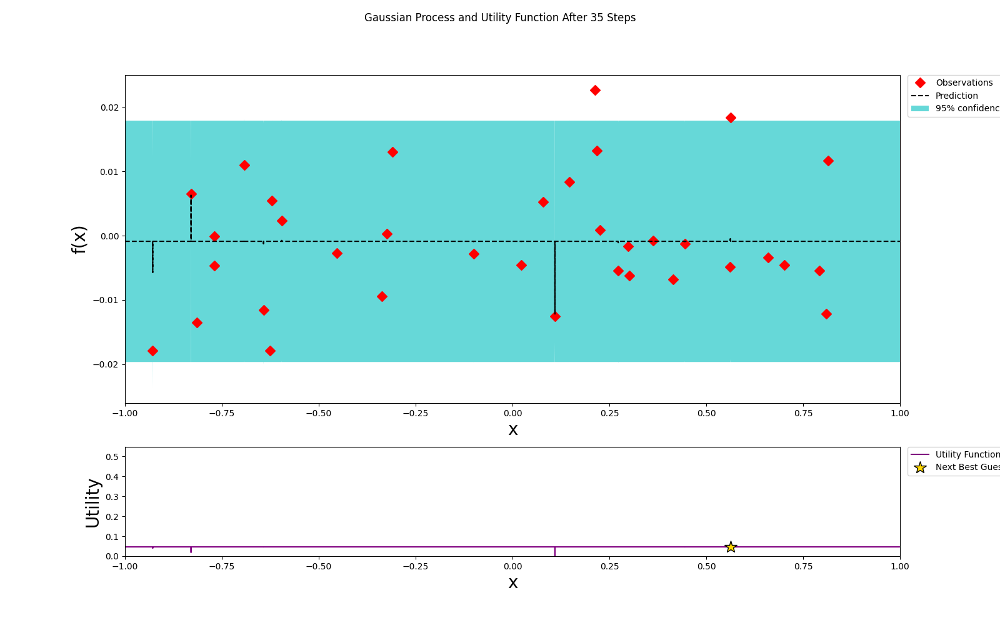

In [ ]:
coupB = np.linspace(-1.0, 1.0, 10000).reshape(-1, 1)
plot_gp(optimizer, coupB, (-1.0, 1.0), "couplingB")

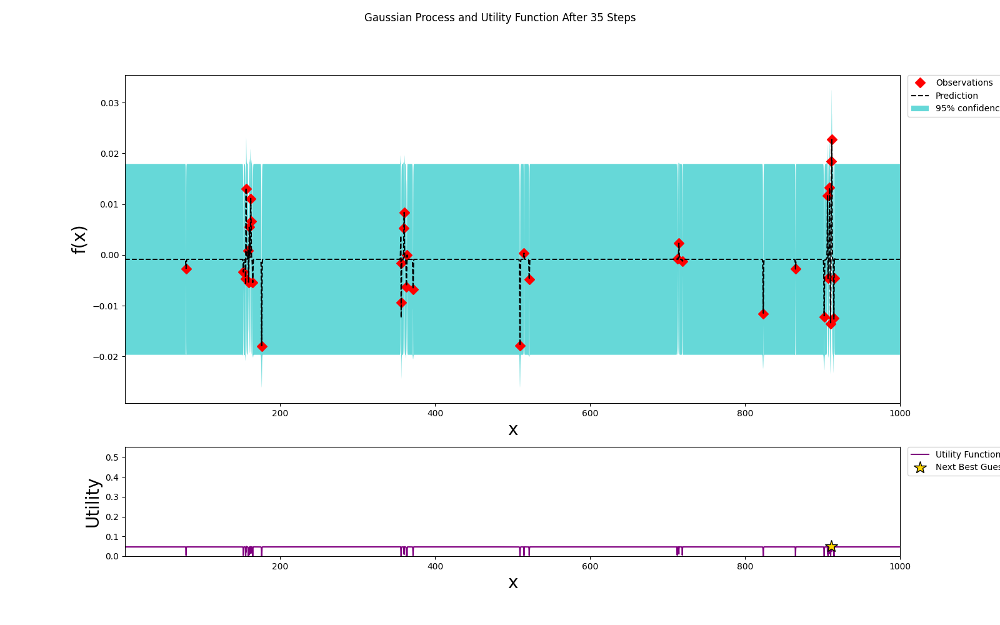

In [ ]:
coupS = np.linspace(0.01, 1000.0, 10000).reshape(-1, 1)
plot_gp(optimizer, coupS, (0.01, 1000.0), "couplingS")

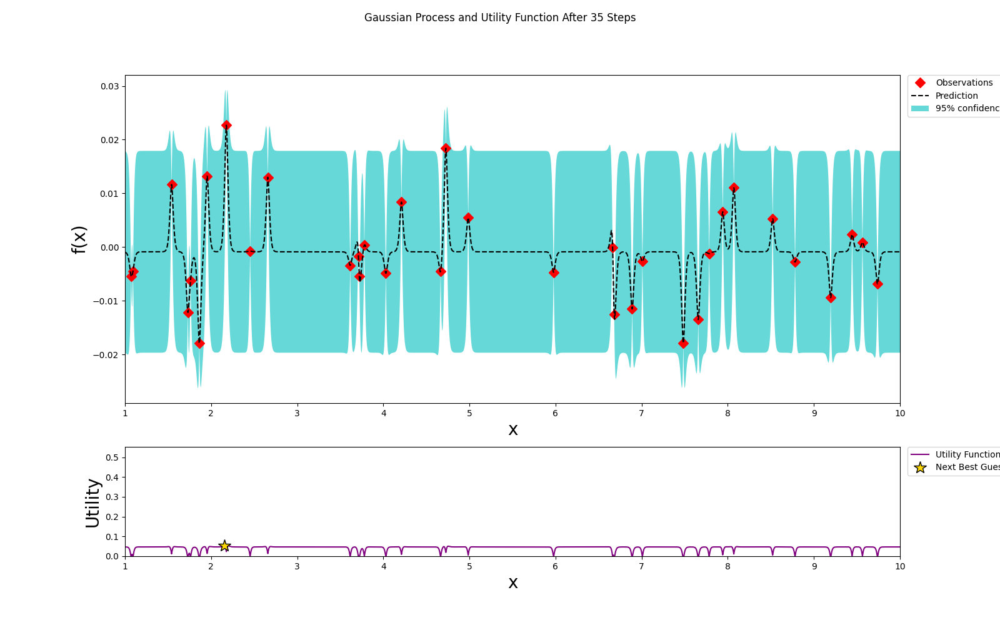

In [ ]:
spd = np.linspace(1., 10., 10000).reshape(-1, 1)
plot_gp(optimizer, spd, (1., 10.), "speed")

In [ ]:
if colab:
    main_larter_folder = '/content/drive/MyDrive/tvb_comparison/larterResults/'
else:
    main_larter_folder = r'D:\\ISO_CODE\\larter'

# Load results of Bayesian Optimization
larter_bo_params = np.load(os.path.join(main_larter_folder, 'larter_bo_params.npy'))
larter_bo_values = np.load(os.path.join(main_larter_folder, 'larter_bo_values.npy'))

*Define helper functions for visualization*

Maybe add another for the GP?

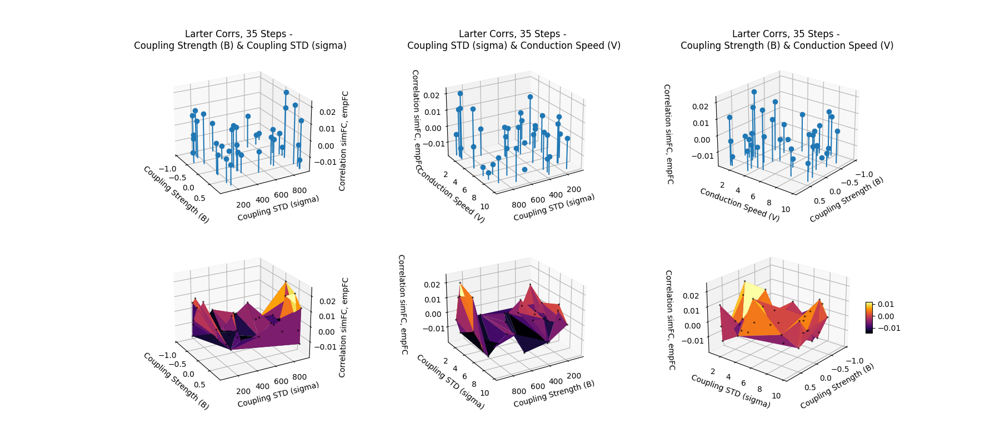

In [ ]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.tri as mtri

# Turn them into numpy arrays
larter_bo_paramsNP = np.array(larter_bo_params)
larter_bo_valuesNP = np.array(larter_bo_values)

# Function to plot the Bayesian Optimization results for every parameter value
def plot_bo_results(bo_params, bo_values, model_name, label1, label2, label3, zlabel):
    # Create a 3D figure
    fig, axs = plt.subplots(2, 3, subplot_kw=dict(projection='3d'), figsize=(18,8))
    # Extract the number of iterations of Bayesian Optimization
    steps = len(bo_values)

    # ------------------- Get the first combination of parameter values
    x1 = bo_params[:, 0]
    y1 = bo_params[:, 1]
    # Get the output Bayesian Optimization values
    z = bo_values
    # Define the bar3d object
    axs[0, 0].stem(x1, y1, z, bottom=z.min(), basefmt=" ", orientation='z')
    axs[0, 0].view_init(elev=23, azim=-29)
    # Set a title to the subplot
    axs[0, 0].set_title('{} Corrs, {} Steps -\n {} & {}'.format(model_name, steps, label1, label2))
    # Set the labels of the figure
    axs[0, 0].set_xlabel('{}'.format(label1))
    axs[0, 0].set_ylabel('{}'.format(label2))
    axs[0, 0].set_zlabel('{}'.format(zlabel))

    # Define the triangulation
    triang = mtri.Triangulation(x1, y1)
    # Plot the triangulation with inferno cmap
    im1 = axs[1, 0].plot_trisurf(triang, z, cmap='inferno')
    axs[1, 0].scatter(x1, y1, z, marker='.', s=10, c="black", alpha=0.5)
    axs[1, 0].view_init(elev=23, azim=-29)
    # Set the labels of the figure
    axs[1, 0].set_xlabel('{}'.format(label1))
    axs[1, 0].set_ylabel('{}'.format(label2))
    axs[1, 0].set_zlabel('{}'.format(zlabel))


    # ------------------- Get the second combination of parameter values
    x2 = bo_params[:, 1]
    y2 = bo_params[:, 2]
    # Define the bar3d object
    axs[0, 1].stem(x2, y2, z, bottom=z.min(), basefmt=" ", orientation='z')
    axs[0, 1].view_init(elev=23, azim=59)
    # Set a title to the subplot
    axs[0, 1].set_title('{} Corrs, {} Steps -\n {} & {}'.format(model_name, steps, label2, label3))
    # Set the labels of the figure
    axs[0, 1].set_xlabel('{}'.format(label2))
    axs[0, 1].set_ylabel('{}'.format(label3))
    axs[0, 1].set_zlabel('{}'.format(zlabel))

    # Define the triangulation
    triang = mtri.Triangulation(x2, y2)
    # Plot the triangulation with inferno cmap
    im2 = axs[1, 1].plot_trisurf(triang, z, cmap='inferno')
    axs[1, 1].scatter(x2, y2, z, marker='.', s=10, c="black", alpha=0.5)
    axs[1, 1].view_init(elev=23, azim=59)
    # Set the labels of the figure
    axs[1, 1].set_xlabel('{}'.format(label1))
    axs[1, 1].set_ylabel('{}'.format(label2))
    axs[1, 1].set_zlabel('{}'.format(zlabel), labelpad=15)

    # ------------------- Get the third combination of parameter values
    x3 = bo_params[:, 0]
    y3 = bo_params[:, 2]
    # Define the bar3d object
    axs[0, 2].stem(x3, y3, z, bottom=z.min(), basefmt=" ", orientation='z')
    axs[0, 2].view_init(elev=23, azim=39)
    # Set a title to the subplot
    axs[0, 2].set_title('{} Corrs, {} Steps -\n {} & {}'.format(model_name, steps, label1, label3))
    # Set the labels of the figure
    axs[0, 2].set_xlabel('{}'.format(label1))
    axs[0, 2].set_ylabel('{}'.format(label3))
    axs[0, 2].set_zlabel('{}'.format(zlabel), labelpad=15)

    # Define the triangulation
    triang = mtri.Triangulation(x3, y3)
    # Plot the triangulation with inferno cmap
    im3 = axs[1, 2].plot_trisurf(triang, z, cmap='inferno')
    axs[1, 2].scatter(x3, y3, z, marker='.', s=10, c="black", alpha=0.5)
    axs[1, 2].view_init(elev=23, azim=39)
    # Add a color bar to the plot
    fig.colorbar(im3, shrink=0.2, aspect=5)
    # Set the labels of the figure
    axs[1, 2].set_xlabel('{}'.format(label1))
    axs[1, 2].set_ylabel('{}'.format(label2))
    axs[1, 2].set_zlabel('{}'.format(zlabel), labelpad=7)

    plt.show()

# Define the name of the model and labels
larter_name = 'Larter'
larter_label1 = 'Coupling Strength (B)'
larter_label2 = 'Coupling STD (sigma)'
larter_label3 = 'Conduction Speed (V)'
larter_zlabel = 'Correlation simFC, empFC'
# Plot the results of Bayesian Optimization
plot_bo_results(larter_bo_paramsNP, larter_bo_valuesNP,
                larter_name, larter_label1, larter_label2, 
                larter_label3, larter_zlabel)


### **5 - Kuramoto**
The equation for this model is:
$$
\begin{equation}
	\dot{\theta}_i =2\pi f +\frac{1}{N}\sum_{j=1}^N K_{ij} \sin( \theta_j(t-\tau_{i,j}) - \theta_i) + \eta_i(t), \ \   i=1\ldots N.
\end{equation}
$$
Here, the equation for $\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right)$ is as follows:
$$
\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right) = \frac{c}{l}\sum_{j=1}^lu_{kj}\sin\left(\mathbf{\Psi}_j\left(t - \tau_{kj}\right) - \mathbf{\Psi}_k(t)\right)
$$
In code, it's the following:
```
class Kuramoto(SparseCoupling):
    r"""
    Provides a Kuramoto-style coupling, a periodic difference of the form
    
    .. math::
        a / N G_ij sin(x_j - x_i)
    
    """
    a = NArray(
        label=":math:`a`",
        default=numpy.array([1.0,]),
        domain=Range(lo=0.0, hi=1.0, step=0.01),
        doc="Rescales the connection strength.",)

    def __str__(self):
        return simple_gen_astr(self, 'a')

    def pre(self, x_i, x_j):
        return numpy.sin(x_j - x_i)

    def post(self, gx):
        return self.a / gx.shape[0] * gx
```
where we alter $a$ and `conduction_speed`. Note that in this case, $a = \frac{G}{N}$, where $G$ is the coupling strength, and $N$ is the number of nodes. Thus, we actually only alter $G$ in a parameter sweep

In [ ]:
# Define model parameters
kuramoto_params = {
        "omega": np.array([60.0 * 2.0 * np.pi / 1e3]),
    }

# Define the model itself
kuramoto_model = models.Kuramoto(**kuramoto_params)

### *Bayesian Optimization - Parameter Exploration*
In Bayesian Optimization, the idea is to use a surrogate *acquisition function* in order to find the next point to evaluate. Here, we use a specific package that uses a Gaussian process as the surrogate. Bayesian Optimization is particularly suited for optimization of high cost functions, of which this is such a case.

Bayesian optimization works by constructing a posterior distribution of functions (gaussian process) that best describes the function you want to optimize. As the number of observations grows, the posterior distribution improves, and the algorithm becomes more certain of which regions in parameter space are worth exploring and which are not.

As you iterate over and over, the algorithm balances its needs of exploration and exploitation taking into account what it knows about the target function. At each step a Gaussian Process is fitted to the known samples (points previously explored), and the posterior distribution, combined with a exploration strategy (such as UCB (Upper Confidence Bound), or EI (Expected Improvement)), are used to determine the next point that should be explored.

#### *Step 1: Creating the BlackBox Function to Be Optimized*

First, we need to create the costly blackbox function that we optimize over. This is exactly the simulation function, that will do the following:

1. Given a set of parameters, configure the simulator
2. Run a simulation, to get the neural activity results
3. Convert neural activity to BOLD fMRI signal, using the Balloon-Windkessel model
4. Find correlations between BOLD signals for each of the brain regions, to make the simFC
5. Find correlation between simFC and empFC, and maximize this measure

In [ ]:
from bayes_opt import BayesianOptimization, UtilityFunction
from matplotlib import gridspec

*Define the black-box function*

One thing to keep in mind here, is that the BOLD monitor for TVB will sample ONCE every period. For example, since the period for our data is 700ms, then every 700ms, the simulation takes 1 BOLD response sample. Thus, we need to take into consideration BOTH that we ignore the first 20 (samples) * 700 = 14,000 ms of simulation as the transient time, as well as the fact that we need data to analyze afterwards


In [ ]:
import scipy.stats as stats
import scipy.signal as signal
from tqdm import tqdm
import numpy as np

def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

colab = True

# Defining the black-box function
def black_box_kuramoto(couplingG, speed):
    # For every point, replicate 5 times to get an average measure of what the variability is like, or the spread of correlation. The area
    # with the lowest spread and highest correlation is best. We need to test for both a HIGH RELIABILITY AND HIGH PRECISION!!!!

    # Number of replications
    replications = 1
    # Define a range from 0 -> replications
    frames_list = np.arange(0, replications)

    replication_similarities = []

    ############ PARALLELIZING THE 5 REPETITIONS
    for rep in range(0, replications):
      # Define the monitor
      monitor_raw = monitors.Raw()
      # TR is 700 ms for Dr. Pedro's FC data
      monitor_timeAvg = monitors.TemporalAverage(period=700)
      monitor_bold = monitors.Bold(period=700)

      # Define a sigmoidal coupling function
      # ------------ HAS FREE PARAMETER a THAT WILL BE MODIFIED
      N = structuralConnec.weights.shape[0]
      kuramoto_coupling = coupling.Kuramoto(a=np.array(couplingG / N))

      # Define the conduction speed
      # ------------ HAS FREE PARAMETER speed THAT WILL BE MODIFIED
      conduction_speed = speed

      # Define the integrator, that will solve the dynamic equation
      dt = 0.01
      stdNoise = np.array([1e-4])
      kuramoto_noise = noise.Additive(
          nsig=stdNoise, noise_seed=np.random.randint(1, 1000000))
      kuramoto_integrator = integrators.HeunStochastic(
          dt=dt, noise=kuramoto_noise)

      # Define the simulation length - remember that we ignore the first 20 * TR (700) = 14000
      TR = 700
      multiple_TR = 40
      simulation_len =  multiple_TR * TR

      kuramoto_simulator = simulator.Simulator(
          model=kuramoto_model,
          connectivity=structuralConnec,
          conduction_speed=conduction_speed,
          coupling=kuramoto_coupling,
          integrator=kuramoto_integrator,
          monitors=(monitor_raw, monitor_timeAvg, monitor_bold),
          simulation_length=simulation_len
      )
      kuramoto_simulator.configure()

      ################################################################## RUNNING SIMULATION

      # 2. Run a simulation to get ALL 3 types of results
      # 2.1 Perform the simulation
      tic = time.time()
      (kuramoto_raw_time, kuramoto_raw_data), (kuramoto_tavg_time, kuramoto_tavg_data), (kuramoto_bold_time, kuramoto_bold_data) = kuramoto_simulator.run()
      print('simulation required %0.3f seconds.' % (time.time()-tic))

      ################################################################## SAVING RESULTS OF SIMULATION

      # 2.3 Save the results
      if colab:
          kuramoto_folder = r'/content/drive/MyDrive/tvb_comparison/kuramoto/replication{}'.format(rep)
          new_kuramoto_folder = r'/content/drive/MyDrive/tvb_comparison/kuramoto/replication{}'.format(rep)
      else:
          kuramoto_folder = r'D:\\ISO_CODE\\kuramoto\\replication{}'.format(rep)
          new_kuramoto_folder = r'D:\\ISO_CODE\\kuramoto\\replication{}'.format(rep)
      i = 1
      # If folder for results exists, change name until name doesnt exist
      while os.path.exists(new_kuramoto_folder):
          new_kuramoto_folder = kuramoto_folder + str(i)
          i += 1
      os.makedirs(new_kuramoto_folder)

      np.save(os.path.join(new_kuramoto_folder, 'tavg_time.npy'), kuramoto_tavg_time)
      np.save(os.path.join(new_kuramoto_folder, 'tavg_data.npy'), kuramoto_tavg_data)
      np.save(os.path.join(new_kuramoto_folder, 'bold_time.npy'), kuramoto_bold_time)
      np.save(os.path.join(new_kuramoto_folder, 'bold_data.npy'), kuramoto_bold_data)

      ################################################################## FORMATTING BOLD AND FINDING ORDER

      # 3. Given BOLD signal, find correlation between to make simFC
      # 3.1 Concatenate across axes to get it in correct shape
      kuramoto_bold = np.concatenate(kuramoto_bold_data, axis=0)
      kuramoto_bold = np.concatenate(kuramoto_bold, axis=1)
      # 3.2 Ignore transient part
      kuramoto_bold = np.delete(kuramoto_bold, np.s_[0:20], axis=1)
      # 3.2 GSR signal
      # Get the signal mean to regress it out of signal
      bold_sigMean = np.mean(kuramoto_bold, axis=0)
      bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
      # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
      hundred_ones = np.ones((100, 1))
      # Matrix multiplitcation to get repeated matrix
      bold_sigMean = hundred_ones @ bold_sigMean
      # GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
      # regress new signal from old one
      bold_regressed = kuramoto_bold - bold_sigMean
      ###### BANDPASS FILTER 0.01 -> 0.1
      bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)

      ################################################################## FINDING CORRELATION BETWEEN BOLD FOR simFC

      # 3.3 z-score signal
      kuramoto_b_z = stats.zscore(bold_filtered)
      # 3.4 Find correlations between different brain regions
      kuramoto_simFC = np.corrcoef(kuramoto_b_z)
      np.fill_diagonal(kuramoto_simFC, 0.0)
      np.save(os.path.join(new_kuramoto_folder, 'FC_matrix.npy'), kuramoto_simFC)

      ################################################################## FINDING CORRELATION simFC, empFC

      # 4. Find correlation between simFC and empFC (Pearson coefficient)
      # 4.1 Retrieve the upper triangular parts of both matrices
      functionalConnecMean = np.load(functionalConnecMean_path, allow_pickle=True)
      kuramoto_corr = np.corrcoef(kuramoto_simFC.flatten(), functionalConnecMean.flatten())
      print('corr shape', kuramoto_corr.shape)
      kuramoto_similarity = kuramoto_corr[0, 1]
      # 4.1 Save the found correlation
      np.save(os.path.join(new_kuramoto_folder, 'simFC_empFC_corr.npy'), kuramoto_similarity)

      # Getting the results of the 5 repetitions from the process outputs
      replication_similarities.append(kuramoto_similarity)
      print(replication_similarities)

    # Save results in the appropriate folders - if folder exists, create another
    i = 0
    if colab:
        kuramoto_folder = r'/content/drive/MyDrive/tvb_comparison/kuramoto/replicationResults{}'.format(i)
        new_kuramoto_folder = r'/content/drive/MyDrive/tvb_comparison/kuramoto/replicationResults{}'.format(i)
    else:
        kuramoto_folder = r'D:\\ISO_CODE\\kuramoto\\replicationResults{}'.format(i)
        new_kuramoto_folder = r'D:\\ISO_CODE\\kuramoto\\replicationResults{}'.format(i)
    while os.path.exists(new_kuramoto_folder):
        new_kuramoto_folder = kuramoto_folder + str(i)
        i += 1
    os.makedirs(new_kuramoto_folder)

    # Save across-test FCs
    np.save(os.path.join(new_kuramoto_folder, 'replication_similarities.npy'), np.array(replication_similarities))

    return replication_similarities[-1]

#### *Step 2: Define Parameter Bounds and Optimize*

*Define bounds and optimizer*

In [ ]:
# Defining parameter bounds for the function
N = structuralConnec.weights.shape[0]
parameter_bounds = {'couplingG': (0.0 * N, 1.0 * N), 'speed': (1., 10.)}

# Defining the Bayesian Optimization object
optimizer = BayesianOptimization(
    f=black_box_kuramoto,
    pbounds=parameter_bounds,
    verbose=2,
    random_state=987234
)

*Define acquisition function and maximize*

This function does the actual maximization of the objective function, and takes two parameters: 
1. `n_iter`: Number of steps of BO to perform (the more the better)
2. `init_points`: Number of random exploration steps

In [ ]:
n_iter_BO = 35
n_init = 1

In [ ]:
# Defining the BO acquisition function
acquisition_function = UtilityFunction(kind="ei",xi=1e-1)

# Run the actual optimization
optimizer.maximize(
    n_iter=n_iter_BO,
    init_points=n_init,
    acquisition_function=acquisition_function
)

|   iter    |  target   | couplingG |   speed   |
-------------------------------------------------
simulation required 883.885 seconds.
corr shape (2, 2)
[0.004519860338282929]
| 2         | 0.00452   | 22.59     | 1.322     |
simulation required 900.201 seconds.
corr shape (2, 2)
[0.004318491116272401]
| 3         | 0.004318  | 75.64     | 8.962     |
simulation required 895.810 seconds.
corr shape (2, 2)
[0.08079218547243748]
| 4         | 0.08079   | 10.77     | 7.973     |
simulation required 897.818 seconds.
corr shape (2, 2)
[0.10029443690708706]
| 5         | 0.1003    | 10.45     | 6.385     |
simulation required 899.724 seconds.
corr shape (2, 2)
[0.1478663723580338]
| 6         | 0.1479    | 8.834     | 7.237     |
simulation required 897.273 seconds.
corr shape (2, 2)
[0.11735029397386061]
| 7         | 0.1174    | 6.873     | 8.31      |
simulation required 903.500 seconds.
corr shape (2, 2)
[0.13318637709628184]
| 8         | 0.1332    | 7.105     | 5.396     |
simulation

KeyboardInterrupt: ignored

#### *Step 3: Examine Results*
Now that we've run Bayesian Optimization and have some measure of the best parameters for the model, we can extract the top combinations, to visualize the results in nice plots

*Get results of iterations from Bayesian Optimization*

In [ ]:
colab = True
# Define the lists that will store the results of Bayesian Optimization
kuramoto_bo_values = []
kuramoto_bo_params = []

# For every run of Bayesian Optimization
for i, res in enumerate(optimizer.res):
    # Get the values of each iteration
    kuramoto_bo_values.append(res['target'])
    # Get the parameter values
    kuramoto_bo_params.append(
        [res['params']['couplingG'], res['params']['speed']])

# Save the BO values
if colab:
    main_kuramoto_folder = '/content/drive/MyDrive/tvb_comparison/kuramotoResults/'
else:
    main_kuramoto_folder = r'D:\\ISO_CODE\\kuramoto'
    
if not os.path.exists(main_kuramoto_folder):
    os.makedirs(main_kuramoto_folder)

np.save(os.path.join(main_kuramoto_folder, 'kuramoto_bo_values.npy'),
        np.array(kuramoto_bo_values))
np.save(os.path.join(main_kuramoto_folder, 'kuramoto_bo_params.npy'),
        np.array(kuramoto_bo_params))


In [ ]:
def posterior(optimizer, x_obs, y_obs, grid):
    optimizer._gp.fit(x_obs, y_obs)

    mu, sigma = optimizer._gp.predict(grid, return_std=True)
    return mu, sigma

def plot_gp(optimizer, x, given_lim, name):
    fig = plt.figure(figsize=(16, 10))
    steps = len(optimizer.space)
    fig.suptitle(
        'Gaussian Process and Utility Function After {} Steps'.format(steps),
        fontdict={'size':30}
    )
    
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1]) 
    axis = plt.subplot(gs[0])
    acq = plt.subplot(gs[1])
    
    x_obs = np.array([[res["params"][name]] for res in optimizer.res])
    y_obs = np.array([res["target"] for res in optimizer.res])
    
    mu, sigma = posterior(optimizer, x_obs, y_obs, x)
    # axis.plot(x, y, linewidth=3, label='Target')
    axis.plot(x_obs.flatten(), y_obs, 'D', markersize=8, label=u'Observations', color='r')
    axis.plot(x, mu, '--', color='k', label='Prediction')

    axis.fill(np.concatenate([x, x[::-1]]), 
              np.concatenate([mu - 1.9600 * sigma, (mu + 1.9600 * sigma)[::-1]]),
        alpha=.6, fc='c', ec='None', label='95% confidence interval')
    
    axis.set_xlim(given_lim)
    axis.set_ylim((None, None))
    axis.set_ylabel('f(x)', fontdict={'size':20})
    axis.set_xlabel('x', fontdict={'size':20})
    
    utility_function = UtilityFunction(kind="ucb", kappa=5, xi=0)
    utility = utility_function.utility(x, optimizer._gp, 0)
    acq.plot(x, utility, label='Utility Function', color='purple')
    acq.plot(x[np.argmax(utility)], np.max(utility), '*', markersize=15, 
             label=u'Next Best Guess', markerfacecolor='gold', markeredgecolor='k', markeredgewidth=1)
    acq.set_xlim(given_lim)
    acq.set_ylim((0, np.max(utility) + 0.5))
    acq.set_ylabel('Utility', fontdict={'size':20})
    acq.set_xlabel('x', fontdict={'size':20})
    
    axis.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)
    acq.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)

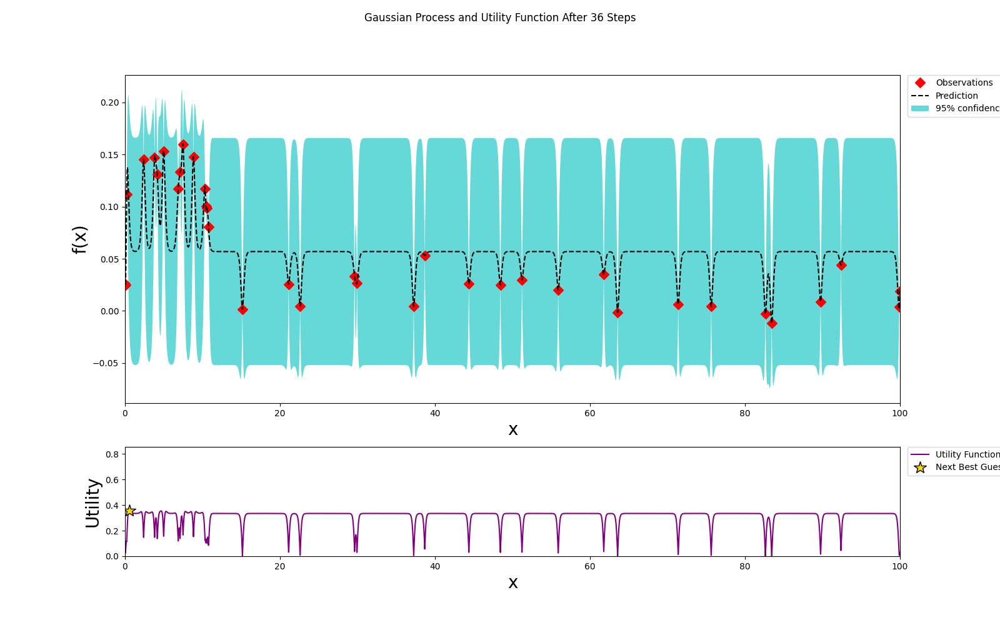

In [ ]:
coup = np.linspace(0 * N, 1 * N, 10000).reshape(-1, 1)
plot_gp(optimizer, coup, (0 * N, 1* N), "couplingG")

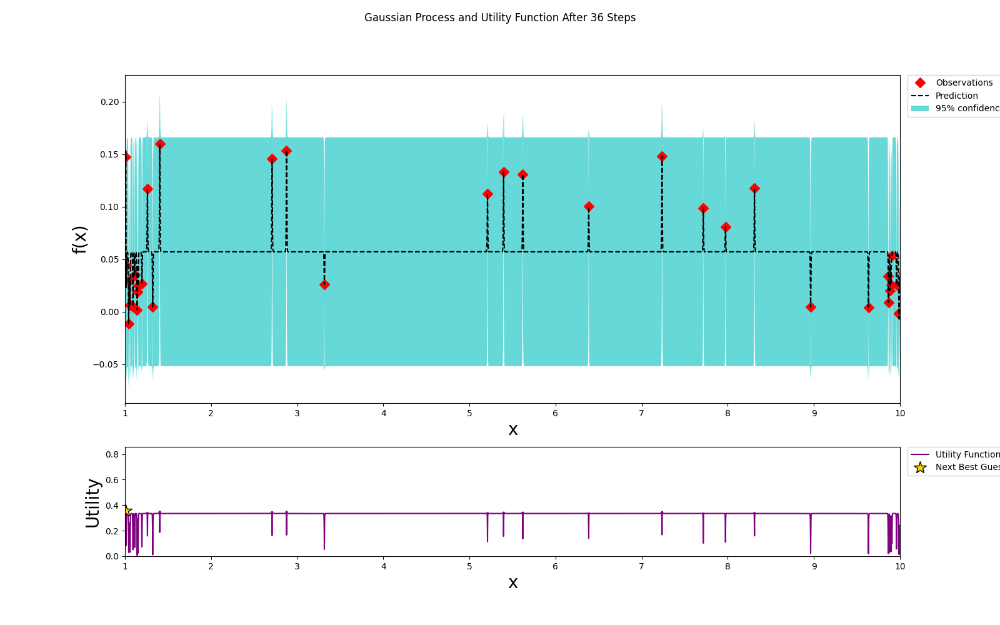

In [ ]:
sped = np.linspace(1., 10.,10000).reshape(-1, 1)
plot_gp(optimizer, sped, (1., 10.), "speed")

In [ ]:
# Load results of Bayesian Optimization
kuramoto_bo_params = np.load(os.path.join(main_kuramoto_folder, 'kuramoto_bo_params.npy'))
kuramoto_bo_values = np.load(os.path.join(main_kuramoto_folder, 'kuramoto_bo_values.npy'))

*Define helper functions for visualization*

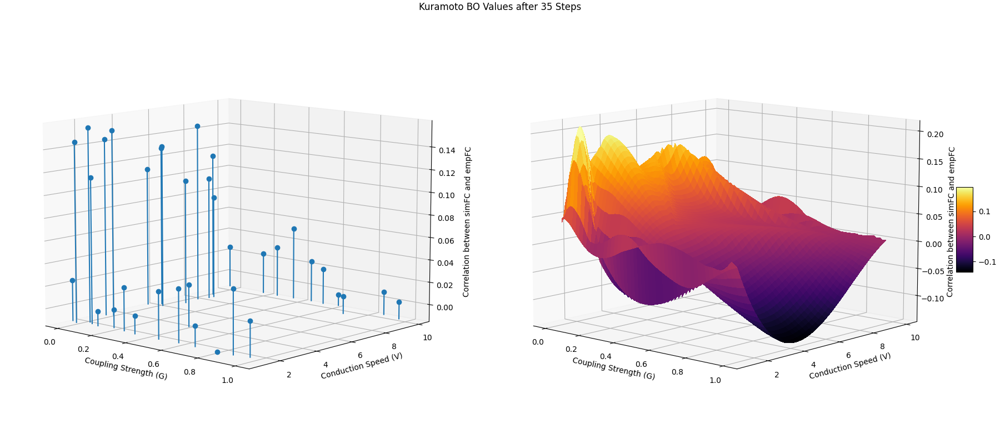

In [ ]:
# Turn them into numpy arrays
kuramoto_bo_paramsNP = np.array(kuramoto_bo_params)
kuramoto_bo_valuesNP = np.array(kuramoto_bo_values)

import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Function to plot the Bayesian Optimization results for every parameter value
def plot_bo_results(bo_params, bo_values, model_name, xlabel, ylabel, zlabel):
    # Extract the number of iterations of Bayesian Optimization
    steps = len(bo_values[:35])

    # Get the two parameter values
    x = bo_params[:35, 0]/100
    y = bo_params[:35, 1]
    # Get the output Bayesian Optimization values
    z = bo_values[:35]

    # Define the figure and first axis
    # fig = plt.figure(figsize=plt.figaspect(0.5))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8), subplot_kw=dict(projection='3d'), constrained_layout=True)
    # Define the min, max of the data
    xi = np.linspace(x.min(),x.max(),100)
    yi = np.linspace(y.min(),y.max(),100)
    # VERY IMPORTANT, to tell matplotlib how is your data organized
    zi = griddata((x, y), z, (xi[None,:], yi[:,None]), method='cubic')
    # Define the stem object
    ax1.stem(x, y, z, bottom=z.min(), basefmt=" ", orientation='z')
    ax1.view_init(elev=10, azim=-48)

    # Create a meshgrid
    xig, yig = np.meshgrid(xi, yi)
    # Define the surface object to plot
    surf = ax2.plot_surface(xig, yig, zi, linewidth=0, cmap='inferno', antialiased=False)
    # Add a color bar to the plot
    fig.colorbar(surf, shrink=0.2, aspect=5)
    ax2.view_init(elev=10, azim=-48)

    # Give the figure a title
    fig.suptitle('{} BO Values after {} Steps'.format(model_name, steps))
    # Set the labels of the figure
    ax1.set_xlabel('{}'.format(xlabel))
    ax2.set_xlabel('{}'.format(xlabel))
    ax1.set_ylabel('{}'.format(ylabel))
    ax2.set_ylabel('{}'.format(ylabel))
    ax1.set_zlabel('{}'.format(zlabel), labelpad=7)
    ax2.set_zlabel('{}'.format(zlabel))
    # Set aspects
    ax1.set_aspect('auto')
    ax2.set_aspect('auto')
    
    # Show the plot
    plt.show()
    
# Define the name of the model and labels
kuramoto_name = 'Kuramoto'
kuramoto_xlabel = 'Coupling Strength (G)'
kuramoto_ylabel = 'Conduction Speed (V)'
kuramoto_zlabel = 'Correlation between simFC and empFC'
# Plot the results of Bayesian Optimization
plot_bo_results(kuramoto_bo_paramsNP, kuramoto_bo_valuesNP,
                kuramoto_name, kuramoto_xlabel, kuramoto_ylabel, kuramoto_zlabel)


### **6 - Stuart-Landau**
The equation for this model is:
The equation for this model is:
$$
\begin{equation}
    \begin{gathered}
	    \frac{dx_j}{dt} = \left[a_j - x_j^2 - y_j^2\right]x_j - \omega_jy_j + G \sum_l C_{lj}\left(x_l - x_j\right)\beta \eta_j(t)
        \\
        \frac{dy_j}{dt} = \left[a_j - x_j^2 - y_j^2\right]y_j + \omega_jx_j + G \sum_l C_{lj}\left(y_l - y_j\right)\beta \eta_j(t)
    \end{gathered}
\end{equation}
$$
Here, the equation for $\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right)$ is as follows:
$$
\Gamma\left(\mathbf{\Psi}_k, \mathbf{\Psi}_j, u_{kj}\right) = \frac{c}{l}\sum_{j=1}^lu_{kj}\sin\left(\mathbf{\Psi}_j\left(t - \tau_{kj}\right) - \mathbf{\Psi}_k(t)\right)
$$
As this is not built into TVB, we implement it ourselves, and the parameters we change are `conduction_speed`, bifurcation parameter $a$, and global coupling factor $G$

In [ ]:
import numpy
from tvb.simulator.models.base import Model
from tvb.basic.neotraits.api import NArray, List, Range, Final
from numba import guvectorize, float64

class Stuart_Landau(Model):
    # Remember that in the equations above, the x and y's are the neural activity variables, a is a bifurcation parameter (INPUT), w is the intrinsic 
    # frequency, which ranged from 0.04 to 0.07 Hz and is determined by the averaged peak frequency of the BOLD signal of EACH REGION (peak freq of
    # filtered BOLD signal for each node), beta is 0.04 and eta is additive Gaussian noise (the standard deviation of the Gaussian noise)

    # Define traited attributes for this model, which represent possible kwargs
    a = NArray(
        label=":math:`a`",
        default=numpy.array([0.]),
        domain=Range(lo = -0.02, hi = 0.02, step = 0.01),
        doc="""The bifurcation parameter of the model"""
    )
    
    omega = NArray(
        label=":math:`omega`",
        default=numpy.array([0.05]),
        domain=Range(lo = 0.04, hi = 0.07, step = 0.01),
        doc="""The intrinsic frequency for each node"""
    )

    # Used for phase-plane axis ranges and to bound random initial() conditions
    state_variable_range = Final(
        label="State Variable ranges [lo, hi]",
        default={"x": numpy.array([-1.0, 1.0]),
                 "y": numpy.array([-1.0, 1.0])},
        doc="""The values for each state-variable should be set to encompass
        the expected dynamic range of that state-variable for the current
        parameters, it is used as a mechanism for bounding random inital
        conditions when the simulation isn't started from an explicit history,
        it is also provides the default range of phase-plane plots.""")

    variables_of_interest = List(
        of=str,
        label="Variables watched by Monitors",
        choices=("x", "y"),
        default=("x",),
        doc="""This represents the default state-variables of this Model to be
               monitored. It can be overridden for each Monitor if desired.""")

    # Define the state variables
    state_variables = ('x', 'y')
    # Number of variables
    _nvar = 2
    cvar = numpy.array([0], dtype=numpy.int32)

    # Defining the dynamic function, or the actual equation
    def dfun(self, state_variables, coupling, local_coupling=0.0):
        x, y = state_variables
        derivative = numpy.empty_like(state_variables)
        c_0 = coupling[0]
        # Defining omega as a randomly sampled value from a Gaussian, every time we integrate
        self.omega = np.array(np.random.normal(0.05, 0.02, 1))
        derivative[0] = (self.a - x**2 - y**2) * x - self.omega * y + c_0
        derivative[1] = (self.a - x**2 - y**2) * y + self.omega * x + c_0

        return derivative

stuart_model = Stuart_Landau()


### *Bayesian Optimization - Parameter Exploration*
In Bayesian Optimization, the idea is to use a surrogate *acquisition function* in order to find the next point to evaluate. Here, we use a specific package that uses a Gaussian process as the surrogate. Bayesian Optimization is particularly suited for optimization of high cost functions, of which this is such a case.

Bayesian optimization works by constructing a posterior distribution of functions (gaussian process) that best describes the function you want to optimize. As the number of observations grows, the posterior distribution improves, and the algorithm becomes more certain of which regions in parameter space are worth exploring and which are not.

As you iterate over and over, the algorithm balances its needs of exploration and exploitation taking into account what it knows about the target function. At each step a Gaussian Process is fitted to the known samples (points previously explored), and the posterior distribution, combined with a exploration strategy (such as UCB (Upper Confidence Bound), or EI (Expected Improvement)), are used to determine the next point that should be explored.

#### *Step 1: Creating the BlackBox Function to Be Optimized*

First, we need to create the costly blackbox function that we optimize over. This is exactly the simulation function, that will do the following:

1. Given a set of parameters, configure the simulator
2. Run a simulation, to get the neural activity results
3. Convert neural activity to BOLD fMRI signal, using the Balloon-Windkessel model
4. Find correlations between BOLD signals for each of the brain regions, to make the simFC
5. Find correlation between simFC and empFC, and maximize this measure

In [ ]:
from bayes_opt import BayesianOptimization, UtilityFunction
from matplotlib import gridspec

*Define the black-box function*

One thing to keep in mind here, is that the BOLD monitor for TVB will sample ONCE every period. For example, since the period for our data is 700ms, then every 700ms, the simulation takes 1 BOLD response sample. Thus, we need to take into consideration BOTH that we ignore the first 20 (samples) * 700 = 14,000 ms of simulation as the transient time, as well as the fact that we need data to analyze afterwards


In [ ]:
import scipy.stats as stats
import scipy.signal as signal
import numpy as np

def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, data)
    return y

# Sample rate and desired cutoff
fs = 1.0
lowcut = 0.01
highcut = 0.1

# Defining the black-box function
def black_box_stuart(couplingA, bifA, speed):
    # For every point, replicate 5 times to get an average measure of what the variability is like, or the spread of correlation. The area
    # with the lowest spread and highest correlation is best. We need to test for both a HIGH RELIABILITY AND HIGH PRECISION!!!!

    # Number of replications
    replications = 1
    # Define a range from 0 -> replications
    frames_list = np.arange(0, replications)

    replication_similarities = []

    ############ PARALLELIZING THE 5 REPETITIONS
    for rep in range(0, replications):
      # Define the monitor
      monitor_raw = monitors.Raw()
      # TR is 700 ms for Dr. Pedro's FC data
      monitor_timeAvg = monitors.TemporalAverage(period=700)
      monitor_bold = monitors.Bold(period=700)

      # Define a sigmoidal coupling function
      # ------------ HAS FREE PARAMETER a THAT WILL BE MODIFIED
      stuart_coupling = coupling.Difference(a=np.array(couplingA))

      # Define the conduction speed
      # ------------ HAS FREE PARAMETER speed THAT WILL BE MODIFIED
      conduction_speed = speed

      # Define the model conduction parameter
      stuart_model.a = np.array(bifA)

      # Define the integrator, that will solve the dynamic equation
      dt = 0.01
      # Beta is defined here as 0.02 or 0.04
      stdNoise = np.array([0.02])
      stuart_noise = noise.Additive(nsig=stdNoise, noise_seed=np.random.randint(1, 1000000))
      stuart_integrator = integrators.HeunStochastic(dt=dt, noise=stuart_noise)

      # Define the simulation length - remember that we ignore the first 20 * TR (700) = 14000
      TR = 700
      multiple_TR = 40
      simulation_len =  multiple_TR * TR

      stuart_simulator = simulator.Simulator(
          model=stuart_model,
          connectivity=structuralConnec,
          conduction_speed=conduction_speed,
          coupling=stuart_coupling,
          integrator=stuart_integrator,
          monitors=(monitor_raw, monitor_timeAvg, monitor_bold),
          simulation_length=simulation_len
      )
      stuart_simulator.configure()

      # RUNNING SIMULATION

      # 2. Run a simulation to get ALL 3 types of results
      # 2.1 Perform the simulation
      tic = time.time()
      (stuart_raw_time, stuart_raw_data), (stuart_tavg_time, stuart_tavg_data), (stuart_bold_time, stuart_bold_data) = stuart_simulator.run()
      print('simulation required %0.3f seconds.' % (time.time()-tic))

      ################################################################## SAVING RESULTS OF SIMULATION
      
      # 2.3 Save the results
      if colab:
          stuart_folder = r'/content/drive/MyDrive/tvb_comparison/stuart/replication{}'.format(rep)
          new_stuart_folder = r'/content/drive/MyDrive/tvb_comparison/stuart/replication{}'.format(rep)
      else:
          stuart_folder = r'D:\\ISO_CODE\\stuart\\replication{}'.format(rep)
          new_stuart_folder = r'D:\\ISO_CODE\\stuart\\replication{}'.format(rep)
      i = 1
      # If folder for results exists, change name until name doesnt exist
      while os.path.exists(new_stuart_folder):
          new_stuart_folder = stuart_folder + str(i)
          i += 1
      os.makedirs(new_stuart_folder)

      np.save(os.path.join(new_stuart_folder, 'tavg_time.npy'), stuart_tavg_time)
      np.save(os.path.join(new_stuart_folder, 'tavg_data.npy'), stuart_tavg_data)
      np.save(os.path.join(new_stuart_folder, 'bold_time.npy'), stuart_bold_time)
      np.save(os.path.join(new_stuart_folder, 'bold_data.npy'), stuart_bold_data)

      ################################################################## FORMATTING BOLD AND FINDING ORDER

      # 3. Given BOLD signal, find correlation between to make simFC
      # 3.1 Concatenate across axes to get it in correct shape
      stuart_bold = np.concatenate(stuart_bold_data, axis=0)
      stuart_bold = np.concatenate(stuart_bold, axis=1)
      # 3.2 Ignore transient part
      stuart_bold = np.delete(stuart_bold, np.s_[0:20], axis=1)
      # 3.2 GSR signal
      # Get the signal mean to regress it out of signal
      bold_sigMean = np.mean(stuart_bold, axis=0)
      bold_sigMean = np.expand_dims(bold_sigMean, axis=0)
      # Make 100x1 matrix of ones to repeat the bold_sigMean for every brain region
      hundred_ones = np.ones((100, 1))
      # Matrix multiplitcation to get repeated matrix
      bold_sigMean = hundred_ones @ bold_sigMean
      # GLOBAL SIGNAL REGRESSION!!! for every time step add all get average then remove that from every sec
      # regress new signal from old one
      bold_regressed = stuart_bold - bold_sigMean
      ###### BANDPASS FILTER 0.01 -> 0.1
      bold_filtered = butter_bandpass_filter(bold_regressed, lowcut, highcut, fs, order=6)

      ################################################################## FINDING CORRELATION BETWEEN BOLD FOR simFC

      # 3.3 z-score signal
      stuart_b_z = stats.zscore(bold_filtered)
      # 3.4 Find correlations between different brain regions
      stuart_simFC = np.corrcoef(stuart_b_z)
      np.fill_diagonal(stuart_simFC, 0.0)
      np.save(os.path.join(new_stuart_folder, 'FC_matrix.npy'), stuart_simFC)

      ################################################################## FINDING CORRELATION simFC, empFC

      # 4. Find correlation between simFC and empFC (Pearson coefficient)
      # 4.1 Retrieve the upper triangular parts of both matrices
      functionalConnecMean = np.load(functionalConnecMean_path, allow_pickle=True)
      stuart_corr = np.corrcoef(stuart_simFC.flatten(), functionalConnecMean.flatten())
      print('corr shape', stuart_corr.shape)
      stuart_similarity = stuart_corr[0, 1]
      # 4.1 Save the found correlation
      np.save(os.path.join(new_stuart_folder, 'simFC_empFC_corr.npy'), stuart_similarity)
      # Save the replication similarities
      replication_similarities.append(stuart_similarity)
      print(replication_similarities)

    # Save results in the appropriate folders - if folder exists, create another
    i = 0
    if colab:
        stuart_folder = r'/content/drive/MyDrive/tvb_comparison/stuart/replicationResults{}'.format(i)
        new_stuart_folder = r'/content/drive/MyDrive/tvb_comparison/stuart/replicationResults{}'.format(i)
    else:
        stuart_folder = r'D:\\ISO_CODE\\stuart\\replicationResults{}'.format(i)
        new_stuart_folder = r'D:\\ISO_CODE\\stuart\\replicationResults{}'.format(i)
    while os.path.exists(new_stuart_folder):
        new_stuart_folder = stuart_folder + str(i)
        i += 1
    os.makedirs(new_stuart_folder)

    # Save across-test FCs
    np.save(os.path.join(new_stuart_folder, 'replication_similarities.npy'), np.array(replication_similarities))

    return replication_similarities[-1]

#### *Step 2: Define Parameter Bounds and Optimize*

*Define bounds and optimizer*

In [ ]:
# Defining parameter bounds for the function
parameter_bounds = {'couplingA': (0.0, 1.0), 'bifA': (-0.02, 0.02), 'speed': (1., 10.)}

# Defining the Bayesian Optimization object
optimizer = BayesianOptimization(
    f=black_box_stuart,
    pbounds=parameter_bounds,
    verbose=2,
    random_state=987234
)

*Define acquisition function and maximize*

This function does the actual maximization of the objective function, and takes two parameters: 
1. `n_iter`: Number of steps of BO to perform (the more the better)
2. `init_points`: Number of random exploration steps

In [ ]:
n_iter_BO = 35
n_init = 1

In [ ]:
# Defining the BO acquisition function
acquisition_function = UtilityFunction(kind="ei", xi=1e-1)

# Run the actual optimization
optimizer.maximize(
    n_iter=n_iter_BO,
    init_points=n_init,
    acquisition_function=acquisition_function
)

|   iter    |  target   |   bifA    | couplingA |   speed   |
-------------------------------------------------------------
simulation required 1094.232 seconds.
corr shape (2, 2)
[0.10661503926720005]
| 1         | 0.1066    | 0.008428  | 0.2536    | 5.27      |
simulation required 1111.638 seconds.
corr shape (2, 2)
[0.13110468297633784]
| 2         | 0.1311    | -0.002551 | 0.8321    | 9.992     |
simulation required 1099.225 seconds.
corr shape (2, 2)
[0.03891330644680308]
| 3         | 0.03891   | 0.0003539 | 0.8236    | 9.973     |
simulation required 1133.448 seconds.
corr shape (2, 2)
[0.06492659641405962]
| 4         | 0.06493   | -0.00905  | 0.07877   | 7.008     |
simulation required 1138.928 seconds.
corr shape (2, 2)
[0.06927361935388292]
| 5         | 0.06927   | -0.006493 | 0.5148    | 3.779     |
simulation required 1145.941 seconds.
corr shape (2, 2)
[0.08973231095951266]
| 6         | 0.08973   | -0.01285  | 0.8236    | 6.889     |
simulation required 1145.747 seconds

#### *Step 3: Examine Results*
Now that we've run Bayesian Optimization and have some measure of the best parameters for the model, we can extract the top combinations, to visualize the results in nice plots

*Get results of iterations from Bayesian Optimization*

In [ ]:
# Define the lists that will store the results of Bayesian Optimization
stuart_bo_values = []
stuart_bo_params = []

# For every run of Bayesian Optimization
for i, res in enumerate(optimizer.res):
    # Get the values of each iteration
    stuart_bo_values.append(res['target'])
    # Get the parameter values
    stuart_bo_params.append(
        [res['params']['couplingA'], res['params']['bifA'], res['params']['speed']])

# Save the BO values
if colab:
    main_stuart_folder = '/content/drive/MyDrive/tvb_comparison/stuartResults/'
else:
    main_stuart_folder = r'D:\\ISO_CODE\\stuart'

if not os.path.exists(main_stuart_folder):
    os.makedirs(main_stuart_folder)

np.save(os.path.join(main_stuart_folder, 'stuart_bo_values.npy'),
        np.array(stuart_bo_values))
np.save(os.path.join(main_stuart_folder, 'stuart_bo_params.npy'),
        np.array(stuart_bo_params))


In [ ]:
def posterior(optimizer, x_obs, y_obs, grid):
    optimizer._gp.fit(x_obs, y_obs)

    mu, sigma = optimizer._gp.predict(grid, return_std=True)
    return mu, sigma

def plot_gp(optimizer, x, given_lim, name):
    fig = plt.figure(figsize=(16, 10))
    steps = len(optimizer.space)
    fig.suptitle(
        'Gaussian Process and Utility Function After {} Steps'.format(steps),
        fontdict={'size':30}
    )
    
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1]) 
    axis = plt.subplot(gs[0])
    acq = plt.subplot(gs[1])
    
    x_obs = np.array([[res["params"][name]] for res in optimizer.res])
    y_obs = np.array([res["target"] for res in optimizer.res])
    
    mu, sigma = posterior(optimizer, x_obs, y_obs, x)
    # axis.plot(x, y, linewidth=3, label='Target')
    axis.plot(x_obs.flatten(), y_obs, 'D', markersize=8, label=u'Observations', color='r')
    axis.plot(x, mu, '--', color='k', label='Prediction')

    axis.fill(np.concatenate([x, x[::-1]]), 
              np.concatenate([mu - 1.9600 * sigma, (mu + 1.9600 * sigma)[::-1]]),
        alpha=.6, fc='c', ec='None', label='95% confidence interval')
    
    axis.set_xlim(given_lim)
    axis.set_ylim((None, None))
    axis.set_ylabel('f(x)', fontdict={'size':20})
    axis.set_xlabel('x', fontdict={'size':20})
    
    utility_function = UtilityFunction(kind="ucb", kappa=5, xi=0)
    utility = utility_function.utility(x, optimizer._gp, 0)
    acq.plot(x, utility, label='Utility Function', color='purple')
    acq.plot(x[np.argmax(utility)], np.max(utility), '*', markersize=15, 
             label=u'Next Best Guess', markerfacecolor='gold', markeredgecolor='k', markeredgewidth=1)
    acq.set_xlim(given_lim)
    acq.set_ylim((0, np.max(utility) + 0.5))
    acq.set_ylabel('Utility', fontdict={'size':20})
    acq.set_xlabel('x', fontdict={'size':20})
    
    axis.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)
    acq.legend(loc=2, bbox_to_anchor=(1.01, 1), borderaxespad=0.)

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


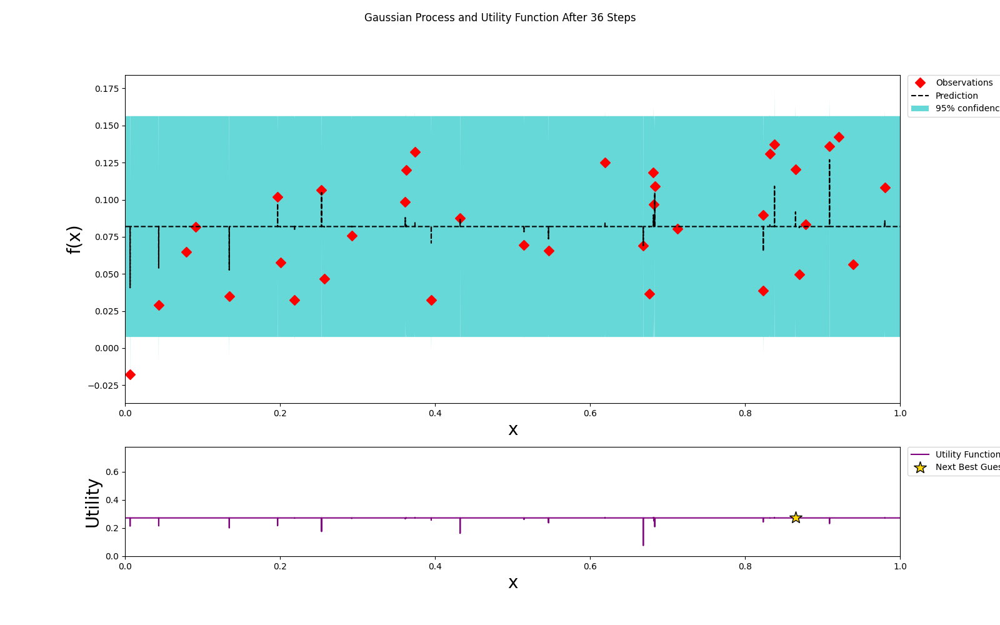

In [ ]:
coupA = np.linspace(0.0, 1.0, 10000).reshape(-1, 1)
plot_gp(optimizer, coupA, (0.0, 1.0), "couplingA")

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


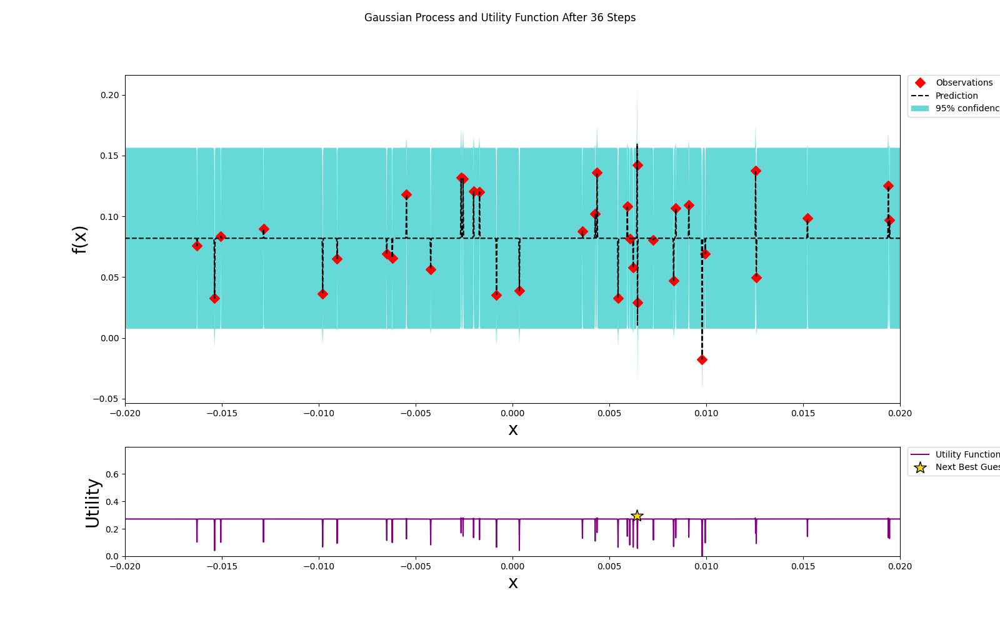

In [ ]:
bifA = np.linspace(-0.02, 0.02, 10000).reshape(-1, 1)
plot_gp(optimizer, bifA, (-0.02, 0.02), "bifA")

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


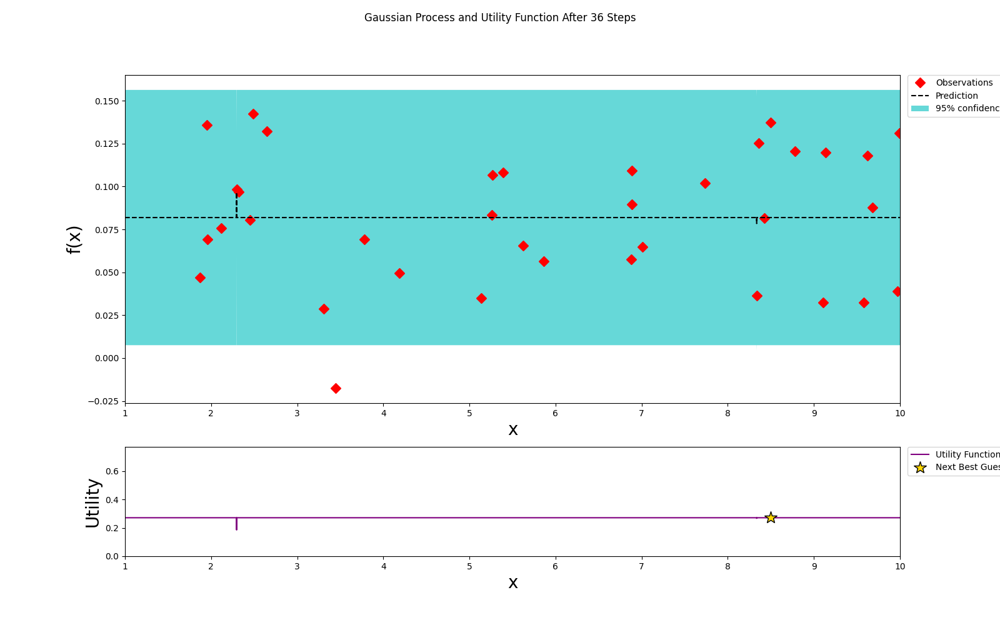

In [ ]:
spd = np.linspace(1, 10, 10000).reshape(-1, 1)
plot_gp(optimizer, spd, (1, 10), "speed")

In [ ]:
if colab:
    main_stuart_folder = '/content/drive/MyDrive/tvb_comparison/stuartResults/'
else:
    main_stuart_folder = r'D:\\ISO_CODE\\stuart'
    
# Load results of Bayesian Optimization
stuart_bo_params = np.load(os.path.join(main_stuart_folder, 'stuart_bo_params.npy'))
stuart_bo_values = np.load(os.path.join(main_stuart_folder, 'stuart_bo_values.npy'))

*Define helper functions for visualization*

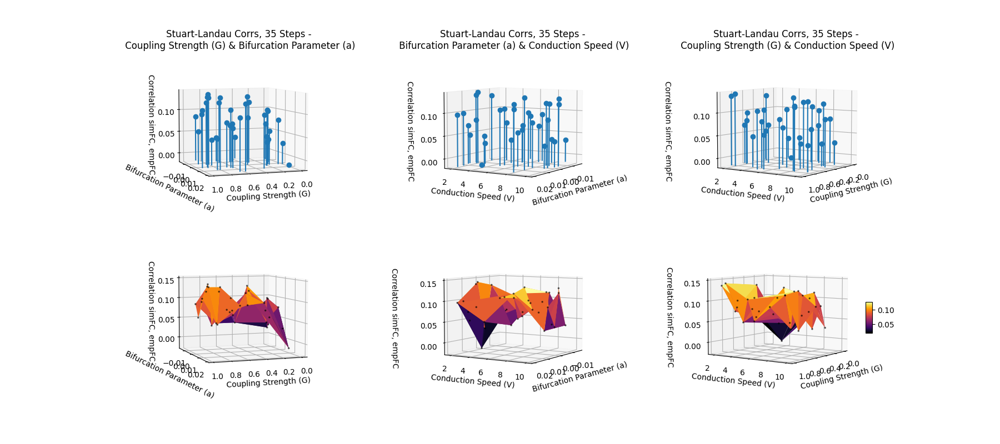

In [ ]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.tri as mtri

# Turn them into numpy arrays
stuart_bo_paramsNP = np.array(stuart_bo_params)
stuart_bo_valuesNP = np.array(stuart_bo_values)

# Function to plot the Bayesian Optimization results for every parameter value
def plot_bo_results(bo_params, bo_values, model_name, label1, label2, label3, zlabel):
    # Create a 3D figure
    fig, axs = plt.subplots(2, 3, subplot_kw=dict(projection='3d'), figsize=(18,8))
    # Extract the number of iterations of Bayesian Optimization
    steps = len(bo_values[:35])

    # ------------------- Get the first combination of parameter values
    x1 = bo_params[:35, 0]
    y1 = bo_params[:35, 1]
    # Get the output Bayesian Optimization values
    z = bo_values[:35]
    # Define the bar3d object
    axs[0, 0].stem(x1, y1, z, bottom=z.min(), basefmt=" ", orientation='z')
    axs[0, 0].view_init(elev=6, azim=70)
    # Set a title to the subplot
    axs[0, 0].set_title('{} Corrs, {} Steps -\n {} & {}'.format(model_name, steps, label1, label2))
    # Set the labels of the figure
    axs[0, 0].set_xlabel('{}'.format(label1))
    axs[0, 0].set_ylabel('{}'.format(label2))
    axs[0, 0].set_zlabel('{}'.format(zlabel))

    # Define the triangulation
    triang = mtri.Triangulation(x1, y1)
    # Plot the triangulation with inferno cmap
    im1 = axs[1, 0].plot_trisurf(triang, z, cmap='inferno')
    axs[1, 0].scatter(x1, y1, z, marker='.', s=10, c="black", alpha=0.5)
    axs[1, 0].view_init(elev=6, azim=70)
    # Set the labels of the figure
    axs[1, 0].set_xlabel('{}'.format(label1))
    axs[1, 0].set_ylabel('{}'.format(label2))
    axs[1, 0].set_zlabel('{}'.format(zlabel))


    # ------------------- Get the second combination of parameter values
    x2 = bo_params[:35, 1]
    y2 = bo_params[:35, 2]
    # Define the bar3d object
    axs[0, 1].stem(x2, y2, z, bottom=z.min(), basefmt=" ", orientation='z')
    axs[0, 1].view_init(elev=6, azim=32)
    # Set a title to the subplot
    axs[0, 1].set_title('{} Corrs, {} Steps -\n {} & {}'.format(model_name, steps, label2, label3))
    # Set the labels of the figure
    axs[0, 1].set_xlabel('{}'.format(label2))
    axs[0, 1].set_ylabel('{}'.format(label3))
    axs[0, 1].set_zlabel('{}'.format(zlabel))

    # Define the triangulation
    triang = mtri.Triangulation(x2, y2)
    # Plot the triangulation with inferno cmap
    im2 = axs[1, 1].plot_trisurf(triang, z, cmap='inferno')
    axs[1, 1].scatter(x2, y2, z, marker='.', s=10, c="black", alpha=0.5)
    axs[1, 1].view_init(elev=6, azim=32)
    # Set the labels of the figure
    axs[1, 1].set_xlabel('{}'.format(label2))
    axs[1, 1].set_ylabel('{}'.format(label3))
    axs[1, 1].set_zlabel('{}'.format(zlabel), labelpad=15)

    # ------------------- Get the third combination of parameter values
    x3 = bo_params[:35, 0]
    y3 = bo_params[:35, 2]
    # Define the bar3d object
    axs[0, 2].stem(x3, y3, z, bottom=z.min(), basefmt=" ", orientation='z')
    axs[0, 2].view_init(elev=6, azim=35)
    # Set a title to the subplot
    axs[0, 2].set_title('{} Corrs, {} Steps -\n {} & {}'.format(model_name, steps, label1, label3))
    # Set the labels of the figure
    axs[0, 2].set_xlabel('{}'.format(label1))
    axs[0, 2].set_ylabel('{}'.format(label3))
    axs[0, 2].set_zlabel('{}'.format(zlabel), labelpad=15)

    # Define the triangulation
    triang = mtri.Triangulation(x3, y3)
    # Plot the triangulation with inferno cmap
    im3 = axs[1, 2].plot_trisurf(triang, z, cmap='inferno')
    axs[1, 2].scatter(x3, y3, z, marker='.', s=10, c="black", alpha=0.5)
    axs[1, 2].view_init(elev=6, azim=35)
    # Add a color bar to the plot
    fig.colorbar(im3, shrink=0.2, aspect=5)
    # Set the labels of the figure
    axs[1, 2].set_xlabel('{}'.format(label1))
    axs[1, 2].set_ylabel('{}'.format(label3))
    axs[1, 2].set_zlabel('{}'.format(zlabel), labelpad=7)

    plt.show()

# Define the name of the model and labels
stuart_name = 'Stuart-Landau'
stuart_label1 = 'Coupling Strength (G)'
stuart_label2 = 'Bifurcation Parameter (a)'
stuart_label3 = 'Conduction Speed (V)'
stuart_zlabel = 'Correlation simFC, empFC'
# Plot the results of Bayesian Optimization
plot_bo_results(stuart_bo_paramsNP, stuart_bo_valuesNP,
                stuart_name, stuart_label1, stuart_label2, 
                stuart_label3, stuart_zlabel)


---
---

# **Part 3:** Model Comparison
Now that we have the results from the models, we need to compare the model performances. We will first need to define some standard for comparison - highest correlation alone isn't enough!

### *Step 1: Grab Bayesian Optimization results for each model*
We only want to grab the final results of Bayesian Optimization, which is easy enough considering we named the folders well

In [ ]:
# Define lists that will have model names and hold the values/params
bo_results = dict()
bo_params = dict()
model_names = ['wilson', 'wong', 'jansen', 'larter', 'kuramoto', 'stuart']

# For each model
for name in model_names:
    # If in colab, different folder name
    if colab:
        # Define main folder path
        main_folder = '/content/drive/MyDrive/tvb_comparison/{}Results/'.format(str(name))
        # Load the results
        model_res = np.load(os.path.join(main_folder, '{}_bo_values.npy'.format(name)))
        model_params = np.load(os.path.join(main_folder, '{}_bo_params.npy'.format(name)))
        # Append to list
        bo_results[name] = model_res[:35]
        bo_params[name] = model_params[:35]
    else:
        # Define main folder path
        main_folder = 'D:\\ISO_CODE\\{}'.format(name)
        # Load the results
        model_res = np.load(os.path.join(main_folder, '{}_bo_values.npy'.format(name)))
        model_params = np.load(os.path.join(main_folder, '{}_bo_params.npy'.format(name)))
        # Append to list
        bo_results[name] = model_res[:35]
        bo_params[name] = model_params[:35]

### *Step 2: Compare the Bayesian Optimization results for each model*
We'll extract a few things in comparison to the models, in order to get a better sense of the model performance not just as absolute accuracy, but also reliability:

1. Highest (absolute) correlation obtainable - ***accuracy***
2. Highest (weighted) correlation obtainable, where we sum up all > 0.85, weighted by how often - ***accuracy/reliability***
3. Most reliably above > 0.75 (> 0.3) correlation - ***reliability***
4. Average difference between parameters for similar correlations (by some margin) - ***structural unidentifiability***
5. Maybe max percent difference or average percent difference?

In [ ]:
import numpy as np
import scipy.stats as stats

# Dictionary of absolute correlation
abs_corr = dict()
abs_corr_idx = dict()
# Dictionary of weighted correlation
weight_for_corr = 0.05
weighted_corr = dict()
# Dictionary of mode of correlations
mode_corr = dict()
# Dictionary of how often above 0.1
weight_for_reliab = 0.1
freq_75 = dict()
# Dictionary of difference in parameter values
margin = 0.05
threshold_params = 0.5
model_diff_params = dict()
# Creating a dictionary to hold the number of similar parameters
num_diff_params = dict()

# For each model, or key of dict specifically
for model_name, values in bo_results.items():
    values = np.array(values)
    values = np.expand_dims(values, axis=1)

    # 1- Find the maximum correlation 
    max_value = round(np.max(values), 3)
    max_value_idx = np.argmax(values)
    abs_corr[model_name] = max_value
    abs_corr_idx[model_name] = max_value_idx

    # 2- Find the weighted correlation
    # Find indices where value is greater than 0.85
    indices_85 = np.where(values >= weight_for_corr)
    # Get number of occurences and values
    greater_85_freq = len(indices_85[0])
    greater_85_sum = values[indices_85].sum()
    # Weight the two
    weight_85 = round(greater_85_sum * greater_85_freq, 3)
    # Append to dictionary
    weighted_corr[model_name] = weight_85

    # 3- Find the mode of the data
    mode_corr[model_name] = round(stats.mode(values, axis=0, keepdims=False)[0][0], 3)

    # 4- Find the most reliable one
    # Find indices where value is greater than 0.75
    indices_75 = np.where(values >= weight_for_reliab)
    # Get number of occurences
    greater_75_freq = len(indices_75[0])
    # Append to dictionary
    freq_75[model_name] = greater_75_freq

    # 5- Average difference between parameters for the same correlation
    # Create a dictionary, where the key is the index (where correlations are similar) and value is parameter values
    idx_diff_params = dict()
    # Create a list that has seen index combos for this model ([0, 1] is the same as [1, 0])
    seen = set()

    ###### Actually doing it
    # Make a numpy array of ones, the same size as the values array
    ones_array = np.ones_like(values)
    # Create matrix of the same values, repeated across rows
    row_rep_mat = values @ ones_array.T
    # Subtract to get matrix of the differences of all elements to each other
    differences_mat = abs(row_rep_mat.T - row_rep_mat)
    # Note that this matrix will be a symmetric one, with 0s along the diagonal. The easiest way to find the indices
    # where the difference is less than a margin is to use the *entire* matrix to find indices, then from the params
    # list, 1- get the params for both elements of an index (i.e. for location [0, 1], get params [0], [1])
    # 2- get only unique params (i.e., params [0], [1] are the same as [1], [0])
    # Get the indices where the value is less than or equal to a margin - this returns array of arrays, each a position
    less_diff_idx = np.argwhere(differences_mat <= margin)
    # For every item in the indices list
    for idx, index_val in enumerate(less_diff_idx):
        index_val = np.array(index_val)
        # Ignore diagonal
        if len(set(index_val.flatten())) == 1:
            continue
        # If not already seen and not diagonal, get parameter values for EACH row in the index and add to seen
        index_val_tuple = tuple(sorted(index_val))
        if index_val_tuple not in seen:
          # Key: value of the index. Item: parameter values for each one of the indices (each row)
          idx_diff_params[str(index_val_tuple)] = [np.round(bo_params[model_name][index_val_tuple[i]], 3) for i in range(0, len(index_val_tuple))]
          # Check the difference in parameter values - if greater than a specific threshold (more than 15% different)
          difference_params = abs(idx_diff_params[str(index_val_tuple)][0] - idx_diff_params[str(index_val_tuple)][1])
          # Get the threshold as a multiple of the first list in the 2 rows list
          threshold_acceptance = threshold_params * idx_diff_params[str(index_val_tuple)][0]
          # Make them into a zipped tuple to compare element-wise
          for (diff, thresh) in zip(difference_params, threshold_acceptance):
            # If element-wise difference greater than element-wise threshold, then append
            if diff > thresh:
              model_diff_params[model_name] = idx_diff_params
              num_diff_params[model_name] = len(model_diff_params[model_name].keys())
          # Append to seen
          seen.add(index_val_tuple)
    # print('Model: ', model_name)
    # print('model_diff_params[model]', model_diff_params[model_name])

print('Absolute max correlations: ', abs_corr)
print('Index of absolute max correlations: ', abs_corr_idx)
# print('Weighted (by > {} frequency) max correlations: {}'.format(str(0.05), weighted_corr))
print('Mode of correlations: ', mode_corr)
print('Frequency of > {} correlation for each model: {}'.format(str(0.1), freq_75))
print('Number of parameters more than {}% different for {} correlation difference: {}'.format(str(threshold_params * 100), str(margin), num_diff_params))

Absolute max correlations:  {'wilson': 0.086, 'wong': 0.082, 'jansen': 0.059, 'larter': 0.023, 'kuramoto': 0.16, 'stuart': 0.142}
Index of absolute max correlations:  {'wilson': 21, 'wong': 18, 'jansen': 21, 'larter': 13, 'kuramoto': 11, 'stuart': 19}
Mode of correlations:  {'wilson': -0.022, 'wong': -0.013, 'jansen': -0.011, 'larter': -0.018, 'kuramoto': -0.012, 'stuart': -0.018}
Frequency of > 0.1 correlation for each model: {'wilson': 0, 'wong': 0, 'jansen': 0, 'larter': 0, 'kuramoto': 11, 'stuart': 13}
Number of parameters more than 50.0% different for 0.05 correlation difference: {'wilson': 511, 'wong': 566, 'jansen': 573, 'larter': 595, 'kuramoto': 300, 'stuart': 358}


### *Step 3: Empirical vs Simulated FC for each model*

Here, we show the Empirical FC, and all the best simulated FCs for every model

In [ ]:
from scipy import stats, signal

# Dictionary to store the FC matrices
best_simFC = dict()
# Main path in folders
main_folder_FC = '/content/drive/MyDrive/tvb_comparison/'

SC_FC_path = '/content/drive/MyDrive/tvb_comparison/SC_FC_arrays'
functionalConnecMean_path = os.path.join(SC_FC_path, 'functionalConnecMean.npy')

# For every model
for name in model_names:
  # Create the pathname for the model
  current_model_path = os.path.join(main_folder_FC, name)
  # Get the index of maximum correlation
  max_idx = abs_corr_idx[name]
  # Create pathname for the replication
  model_rep_path = os.path.join(current_model_path, 'replication0{}'.format(max_idx))
  # Get the bold data
  current_model_FC = np.load(os.path.join(model_rep_path, 'FC_matrix.npy'))
  # Append to dictionary of FC
  best_simFC[name] = current_model_FC

Text(0.5, 0.98, 'empFC and simFC')

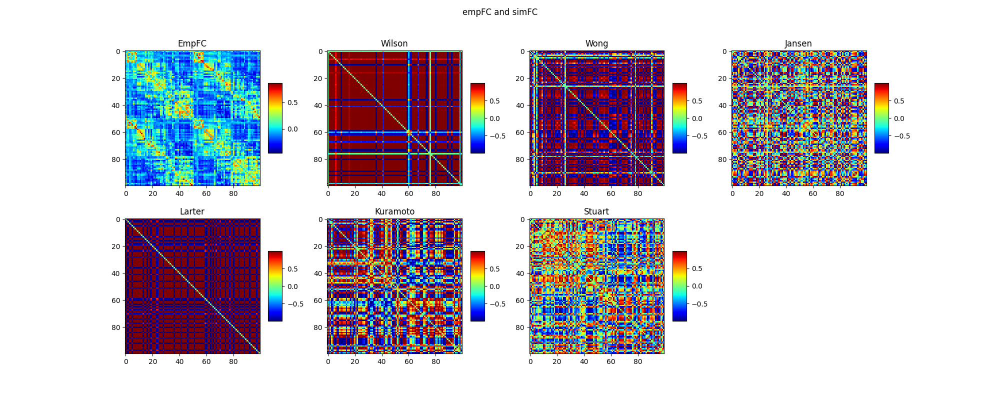

In [ ]:
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(2, 4, 1)
im1 = ax.imshow(functionalConnecMean, interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im1, shrink=0.5, aspect=5)
ax.set_title('EmpFC')

axWil = fig.add_subplot(2, 4, 2)
im2 = axWil.imshow(best_simFC['wilson'], interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im2, shrink=0.5, aspect=5)
axWil.set_title('Wilson')

axWong = fig.add_subplot(2, 4, 3)
im3 = axWong.imshow(best_simFC['wong'], interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im3, shrink=0.5, aspect=5)
axWong.set_title('Wong')

axJan = fig.add_subplot(2, 4, 4)
im4 = axJan.imshow(best_simFC['jansen'], interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im4, shrink=0.5, aspect=5)
axJan.set_title('Jansen')

axlart = fig.add_subplot(2, 4, 5)
im5 = axlart.imshow(best_simFC['larter'], interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im5, shrink=0.5, aspect=5)
axlart.set_title('Larter')

axkura = fig.add_subplot(2, 4, 6)
im6 = axkura.imshow(best_simFC['kuramoto'], interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im6, shrink=0.5, aspect=5)
axkura.set_title('Kuramoto')

axstu = fig.add_subplot(2, 4, 7)
im7 = axstu.imshow(best_simFC['stuart'], interpolation='nearest', aspect='equal', cmap='jet')
plt.colorbar(im7, shrink=0.5, aspect=5)
axstu.set_title('Stuart')

fig.suptitle('empFC and simFC')
